# ĐỒ ÁN LẬP TRÌNH SONG SONG ỨNG DỤNG

## DANH SÁCH THÀNH VIÊN

Nhóm 7

Tên nhóm: LK

20120510 - Nguyễn Hữu Anh Khoa

20120322 - Đặng Thiên Long

Link github: https://github.com/huukhoa2112/LTSSUD

Link colab: https://colab.research.google.com/drive/1mI6wLjee7LfipA1Q7z1lFRetSPA5_SKl?usp=sharing

## ĐỀ TÀI: ENHANCING IMAGE DOCUMENT

### 1. Giới thiệu tổng quan:

**Enhancing document image** là một bước trong công việc xử lý ảnh, là bước nền cơ bản hỗ trợ cho các chức năng nâng cao khác như scan hình ảnh, chuyển đổi văn bản trong ảnh thành dạng text, điều chỉnh lại góc chụp của bức ảnh,  tối ưu hóa hình ảnh của các tài liệu hoặc văn bản số để nâng cao chất lượng, độ rõ nét và khả năng đọc của chúng.

**Input:** một bức ảnh có góc chụp không trực diện với màn hình và background dư thừa.

**Output:** một bức ảnh có góc chụp trực diện với màn hình và loại bỏ background.

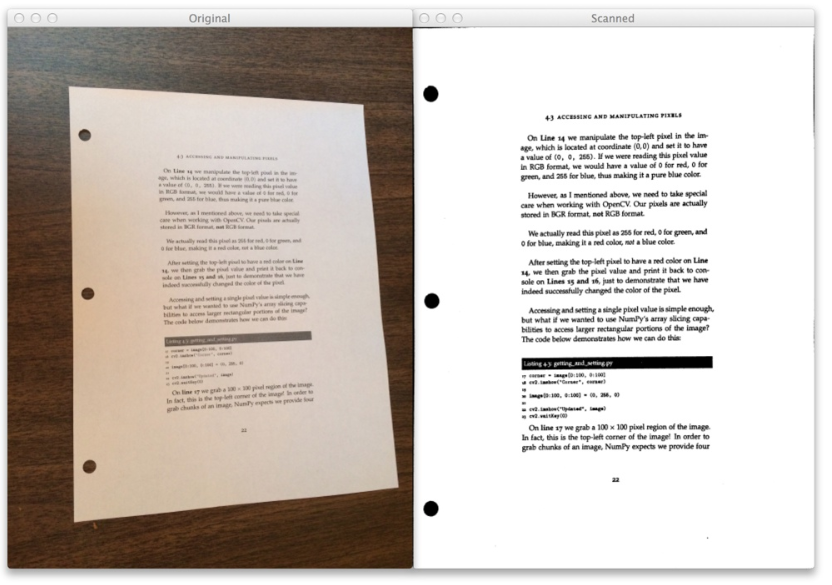

### 2. Ứng dụng của bài toán:

* Ứng dụng ở các trường học khi nộp bài tập, báo cáo online để các giáo viên dễ chấm bài và xem rõ hơn. Một số ứng dụng trên điện thoại: CamScanner, Microsoft Lens.
* Quảng cáo và marketing, tạo ra hình ảnh sạch sẽ thu hút khách hàng.
* Các web bán lẻ trực tuyến sử dụng công nghệ này giúp người mua dễ dàng nhận biết sản phẩm và tăng khả năng quyết định mua hàng.

Bài toán **Enhancing document image** cần được song song hóa là vì:

- Sự phức tạp của thuật toán ở các bước xử lí hình ảnh, các phép biến đổi hình học và loại bỏ background.
- Sự không đồng nhất giữa các bức ảnh do mỗi ảnh đều có cấu trúc và độ phức tạp khác nhau.
- Tăng tốc độ xử lí và tối ưu hóa GPU.

### 4. Ý tưởng chung

Các bước thực hiện:

- Phát hiện biên cạnh.
- Xác định viền của đối tượng dựa trên các cạnh đã xác định.
- Đưa ảnh về đối diện màn hình.
- Điều chỉnh độ tương phản, độ sáng của bức ảnh.

#### 4.1 Phát hiện biên cạnh


* Phát hiện biên cạnh là bước tìm ra các biên thuộc các đối tượng trong ảnh, nhầm phân tách và biết được hình dạng (shape) các đối tượng đó.
* Có 2 thuật toán nổi tiếng cho bài toán này là Sobel edge detector và Canny edge detector.
* Trong bài toán này nhóm chọn sử dụng thuật toán Canny edge detector. Thuật toán gồm 4 giai đoạn nhỏ:
    
    1. Làm mịn hình ảnh (giảm nhiễu): tiến hành làm mờ và giảm nhiễu cho bức ảnh bằng Gaussian ([Công thức của Gaussian Filter](https://docs.opencv.org/2.4/doc/tutorials/imgproc/gausian_median_blur_bilateral_filter/gausian_median_blur_bilateral_filter.html#gaussian-filter)). Điều này giúp giảm các đỉnh và đáy không mong muốn trong đồ thị biểu diễn cạnh, giúp tạo ra kết quả cạnh chính xác hơn.

    **Công thức Gaussian Filter:**

  $$G_{0}(x, y) = A  e^{ \dfrac{ -(x - \mu_{x})^{2} }{ 2\sigma^{2}_{x} } +  \dfrac{ -(y - \mu_{y})^{2} }{ 2\sigma^{2}_{y} } }$$

  **Trong đó:** μ là giá trị trung bình (đỉnh) và σ biểu thị độ lệch chuẩn (cho mỗi biến x và y)
    
    2. Tính Gradient và hướng gradient: Sau khi làm mịn hình ảnh, gradient của hình ảnh được tính toán để xác định các pixel có độ dốc cao nhất. Sử dụng bộ lọc Sobel X và Sobel Y để lấy ra được đạo hàm theo chiều ngang (Gx) và dọc của bức ảnh (Gy). Từ đó ta sẽ tính được  gradient (độ lớn của sự biến đổi mức sáng ở vị trí pixel tương ứng với ảnh gốc) và hướng của từng pixel trong ảnh theo công thức sau. Trong đó hướng của cạnh được chia thành 4 hướng đại diện: ngang (0 độ), chéo bên phải (45 độ), dọc (90 độ), chéo bên trái (135 độ).
  $$Edge\_Gradient(G) = \sqrt{G^2_x + G^2_y}$$

  $$Angle (Θ) = tan^{-1} (\frac{G_y}{G_x})$$
  
    3. Tính non-max suppression (loại bỏ pixel không cần thiết): Mục đích lọc bỏ các pixel không phải là cực đại cục bộ. Ta sử dụng 1 filter 3x3 chạy lần lượt qua các pixel của ảnh sau khi đã gradient. Trong các lần chạy, ta xét độ lớn của pixel hiện tại có phải là cực đại so với 2 hàng xóm (dựa trên hướng gradient)  hay không. Nếu là cực đại thì ghi nhận lại pixel đó, ngược lại set độ lớn của pixel đó bằng 0.

    <div style="text-align:center">
      <img src="https://docs.opencv.org/4.x/nms.jpg" alt="Image" />
    </div>
   
  
    4. Lọc ngưỡng: ở đây ta có 2 giá trị được gọi là maxVal và minVal. Nếu pixel hiện tại có giá trị lớn hơn maxVal thì pixel đó là cạnh, nhỏ hơn minVal thì bị loại bỏ. Còn các pixel nằm giữa maxVal và minVal, ta sẽ xét nó nằm gần với bên nào để quyết định có giữ lại nó hay không.

    <div style="text-align:center">
      <img src="https://docs.opencv.org/4.x/hysteresis.jpg" alt="Image" />
    </div>


**Nguồn:** https://minhng.info/tutorials/xu-ly-anh-opencv-hien-thuc-canny-edge.html

#### 4.2 Xác định viền của đối tượng dựa trên các cạnh đã xác định

Mục tiêu của bước này này là lấy ra được viền của ảnh đã lấy biên, các pixel của ảnh lúc này chỉ là 0 hoặc 255. Sử dụng hàm OpenCV cho bước này vì nhóm không tìm được thuật toán tham khảo để có thể thực hiện cài đặt tuần tự và đưa ra đánh giá. Giá trị trả ra của hàm là toàn bộ các viền có trong ảnh, các viền ở đây là tập hợp các pixel có giá trị 255 và liền kề nhau.

#### 4.3 Đưa ảnh về đối diện màn hình

* Lúc này, ta sẽ lấy các pixel nằm bên trong viền đã được nhận diện ở bước trước đó, thực hiện việc map các điểm ảnh này sang một không gian tọa độ mới (đối diện màn hình).

* Các hướng tiếp cận cho bước có điểm chung là đều được thực hiện bằng cách nhân ma trận trên một hệ tọa độ đồng nhất ([Homogeneous coordinates](https://en.wikipedia.org/wiki/Homogeneous_coordinates)):

    * Sử dụng các **phép xoay ảnh**: Xoay bức ảnh quanh một điểm theo một góc xác định nào đó, vẫn giữ nguyên các tính chất của ảnh (các góc của ảnh vẫn giữ nguyên).
    * Sử dụng **phép biến đổi affine**: Cần xác định ba điểm trên ảnh gốc và vị trí của chúng trên ảnh kết quả. Biến đổi affine giúp tạo ra nhiều tư thế, biến thể khác nhau của vật thể. Các biến thể này sẽ được bảo toàn tính song song, tỉ lệ khoảng cách của vật thể và các đường thẳng trong ảnh.
    * Sử dụng **biến đổi phối cảnh** (Perspective transform hoặc Homography transform): Đây là một phép biến đổi đặc biệt khi mà ảnh kết quả không được đảm bảo về góc, độ dài, tính song song so với ảnh gốc ngoại trừ bảo toàn đường thẳng.


**Phép biến đổi Homography**

* Đối với bài toán này, hình dạng của văn bản trong ảnh đầu vào đa dạng và không phải luôn là chữ nhật $→$ **biến đổi phối cảnh** sẽ là giải pháp tốt nhất để có thể đưa văn bản về đối diện màn hình.

* Các bước thực hiện phép biến đổi Homography:
    
    1. Xác định 4 điểm góc của văn bản trong ảnh đầu vào (source points) và xem nó là 4 đỉnh của ảnh đầu ra (target points).
    
    2. Dựa trên 4 điểm đã chọn, tính chiều dài và rộng cho ảnh đầu ra $→$ xác định được tọa độ 4 đỉnh trong không gian mới và kích thước của ảnh output.
    
    3. Khi đã có được source và target points thì ta có thể dễ dàng tính được ma trận biến đổi **H** (3x3).
    
    4. Thực hiện việc chuyển đổi tọa độ cho từng điểm ảnh bằng công thức sau:
    $$dst(x,y) = src(\frac{H_{0,0}x + H_{0,1}y + H_{0,2}}{H_{2,0}x + H_{2,1}y + H_{2,2}},\frac{H_{1,0}x + H_{1,1}y + H_{1,2}}{H_{2,0}x + H_{2,1}y + H_{2,2}})$$


<div style="text-align:center">
    <img src="https://docs.opencv.org/4.x/homography_perspective_correction.jpg" alt="Image" />
</div>

**Nguồn**: [OpenCV, Basic concepts of the homography explained with code.](https://docs.opencv.org/4.x/d9/dab/tutorial_homography.html)

#### 4.4 Điều chỉnh độ sáng, độ tương phản của ảnh

* Điều chỉnh độ sáng, độ tương phản của bức ảnh sau khi đã đưa ảnh tài liệu về chính diện màn hình.
* Trong GIMP, mức độ tương phản đi từ -127 đến +127


* Bước đầu tiên là tính toán hệ số hiệu chỉnh độ tương phản được đưa ra bởi công thức sau:

$$F = \frac{259(C+255)}{255(259-C)}$$

* Để thuật toán hoạt động chính xác, giá trị của hệ số hiệu chỉnh độ tương phản ( F ) cần được lưu trữ dưới dạng số dấu phẩy động chứ không phải số nguyên. Giá trị C trong công thức biểu thị mức độ tương phản mong muốn.

* Bước tiếp theo là tự thực hiện điều chỉnh độ tương phản thực tế.

$$R' = F(R-128) + 128$$
* Ta sẽ điều chỉnh công thức lại để phù hợp với bài toán:

$$f = 131 * (tương phản + 127) / (127 * (131-tương phản))$$

$$new image = f * (old image - 127) + 127 = f * (old image) + 127 * (1-f)$$

* Tiếp theo ta sẽ tìm ra độ sáng

* Đầu tiên, hãy tính toán giá trị hiệu chỉnh gamma để sử dụng cho việc điều chỉnh âm trung (nếu muốn). Phần sau mô phỏng gần đúng kỹ thuật của Photoshop, áp dụng gamma 9.99-1.00 cho các giá trị midtone 0-128 và 1.00-0.01 cho 128-255.

**Apply gamma correction:**

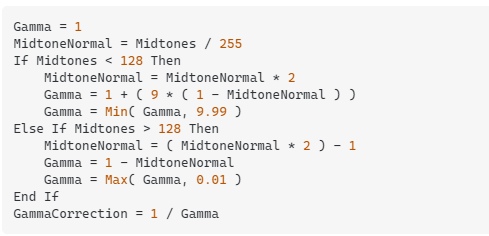


* Sau đó, đối với mỗi giá trị kênh R, G, B (0-255) cho mỗi pixel, hãy thực hiện theo thứ tự sau.

**Apply the input levels:**

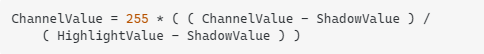

**Apply the midtones:**

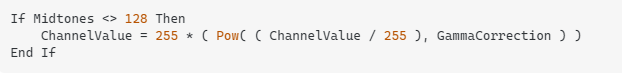

**Apply the output levels:**

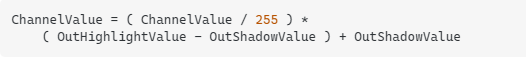

**Trong đó:**

* Tất cả các giá trị kênh và thông số điều chỉnh là số nguyên, bao gồm 0-255
* Shadow / Midtone / HighlightValue là các giá trị điều chỉnh đầu vào (mặc định 0, 128, 255)
* OutShadow / HighlightValue là các giá trị điều chỉnh đầu ra (mặc định là 0, 255)
* Ta sẽ tối ưu hóa mọi thứ và đảm bảo các giá trị được giữ trong giới hạn (chẳng hạn như 0-255 cho mỗi kênh)
* Để mô phỏng Photoshop chính xác hơn, bạn có thể sử dụng đường cong nội suy phi tuyến tính nếu Midtones <128. Theo mặc định, Photoshop cũng cắt bỏ 0,1% giá trị tối nhất và sáng nhất.





















### 5. Cài đặt tuần tự:

Import các thư viện cần thiết

In [ ]:
import numpy as np
from numba import *
from PIL import *
import requests
from io import BytesIO
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
from scipy import ndimage
import math
import time
from numba import jit, cuda
from PIL import Image
from itertools import permutations
import pandas as pd

from skimage.filters import threshold_local
from skimage.metrics import structural_similarity as ssim

import warnings
warnings.filterwarnings('ignore')

Chọn các bức ảnh cần chỉnh

In [ ]:
!unzip -o img.zip


Archive:  img.zip
   creating: img/
  inflating: img/a.jpg               
  inflating: img/b.jpg               
  inflating: img/c.jpg               
  inflating: img/d.jpg               
  inflating: img/e.jpg               
  inflating: img/f.jpg               


In [ ]:
import os
img_dir = 'img'

# Lấy tất cả tên file trong thư mục và load ảnh vào danh sách img
img = [np.asarray(Image.open(os.path.join(img_dir, x))) for x in os.listdir(img_dir)]

#### 5.1 Hàm làm xám ảnh

Mục đích làm xám ảnh là để giảm kích thước dữ liệu, làm nổi bật các cạnh, đặc điểm hình dạng của đối tượng, giảm nhiễu.

In [ ]:
@jit(cache=True)
def convert_RGB_To_Gray(img):
    gray = np.zeros((img.shape[0],img.shape[1]), img.dtype)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            gray[i,j] = round(img[i,j,0] * 0.2989  + img[i,j,1] * 0.5870 + img[i,j,2] * 0.1141, 0)

    return gray

Thời gian hàm làm xám ảnh theo tuần tự

In [ ]:
gray_py = [convert_RGB_To_Gray(x) for x in img]
start_time = time.time()
gray_py = [convert_RGB_To_Gray(x) for x in img]
end_time = time.time()

execution_gray_py_time = end_time - start_time
execution_gray_py_time

0.019714832305908203

Thời gian hàm làm xám ảnh theo thư viện openCV

In [ ]:
start_time = time.time()
gray_cv = [cv2.cvtColor(cv2.cvtColor(x,cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2GRAY) for x in img]
end_time = time.time()

execution_gray_cv_time = end_time - start_time
execution_gray_cv_time


0.02679133415222168










Ảnh sau khi làm xám

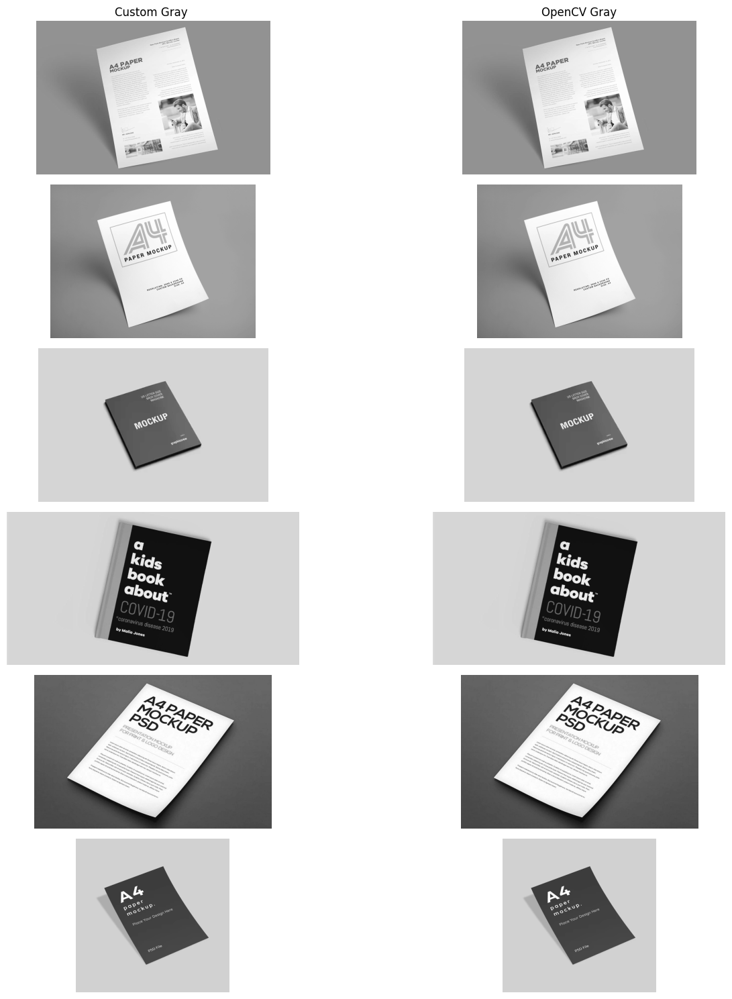

In [ ]:
images = zip(gray_py,gray_cv)
titles = ['Custom Gray ', 'OpenCV Gray']
array_img = list(images)
ncol = 2
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        ax.imshow(array_img[i][j], cmap='gray')
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

Hàm tính độ chính xác evaluate_accuracy sẽ đo độ tương đồng về độ sáng, độ tương phản và độ tương đồng cấu trúc giữa hai ảnh

In [ ]:
def evaluate_accuracy(cv, py):
    ssim_score = ssim(cv, py, data_range=255, channel_axis=-1)
    return ssim_score


Độ chính xác giữa Jit và OpenCV của hàm làm xám

In [ ]:
gray_accuracy = [evaluate_accuracy(gray_py[i], gray_cv[i]) for i in range(len(img))]
print('Độ chính xác giữa Jit và OpenCV là: ', np.mean(gray_accuracy))


Độ chính xác giữa Jit và OpenCV là:  0.9999999903029589


#### 5.2 Convolution Kernel

In [ ]:
@jit(cache=True)
def convolution(img, kernel):
    rows, cols = img.shape
    rows_k, cols_k = kernel.shape

    # Tạo một mảng mới có cùng kích thước với ảnh đầu vào để lưu kết quả convolution
    img_out = np.zeros((rows, cols))

    # Lặp qua từng pixel trong ảnh đầu vào
    for r in range(rows):
        for c in range(cols):
            # Khởi tạo tổng convolution cho pixel hiện tại
            out = 0

            # Lặp qua từng pixel trong kernel
            for r_k in range(rows_k):
                for c_k in range(cols_k):
                    # Tính toán chỉ số hàng và cột của pixel trong ảnh đầu vào
                    in_r = r - rows_k // 2 + r_k
                    in_c = c - cols_k // 2 + c_k

                    # Giới hạn chỉ số hàng và cột trong phạm vi của ảnh
                    in_r = min(max(0, in_r), rows - 1)
                    in_c = min(max(0, in_c), cols - 1)

                    # Tính toán convolution và cộng vào tổng
                    out += kernel[r_k, c_k] * img[in_r, in_c]

            # Gán giá trị convolution đã tính cho pixel tương ứng trong mảng kết quả
            img_out[r, c] = round(out)

    return img_out

#### 5.3 Gaussian Kernel

In [ ]:
@jit(cache = True)
def gaussian_kernel(size, sigma):
    """
    Tạo ma trận Gaussian Kernel.

    Tham số:
    - size: Kích thước của ma trận Gaussian Kernel (phải là một số lẻ).
    - sigma: Độ lệch chuẩn của phân phối Gaussian.

    Trả về:
    Mảng NumPy, ma trận Gaussian Kernel.
    """
    if size % 2 == 0:
        raise ValueError("Kích thước của ma trận Gaussian Kernel phải là một số lẻ.")

    kernel = np.zeros((size, size))
    center = size // 2

    for i in range(size):
        for j in range(size):
            x = i - center
            y = j - center
            kernel[i, j] = np.exp(-(x**2 + y**2) / (2 * sigma**2))

    # Chuẩn hóa ma trận kernel để tổng các phần tử bằng 1
    kernel /= np.sum(kernel)

    return kernel

In [ ]:
gau_kernel_size = 3

Thời gian hàm làm mờ ảnh và convolution

In [ ]:
gau_kernel = gaussian_kernel(gau_kernel_size,1)
gaussianBlur_py = [convolution(gray_py[i], gau_kernel) for i in range(len(img))]
start_time = time.time()
gau_kernel = gaussian_kernel(gau_kernel_size,1)
gaussianBlur_py = [convolution(gray_py[i], gau_kernel) for i in range(len(img))]
end_time = time.time()

execution_gaussianBlur_py_time = end_time - start_time
execution_gaussianBlur_py_time

0.14695429801940918

In [ ]:
start_time = time.time()
gaussianBlur_cv = [cv2.GaussianBlur(gray_cv[i],(gau_kernel_size, gau_kernel_size),1, borderType = cv2.BORDER_REPLICATE)  for i in range(len(img))]
end_time = time.time()

execution_gaussianBlur_cv_time = end_time - start_time
execution_gaussianBlur_cv_time

0.014289379119873047

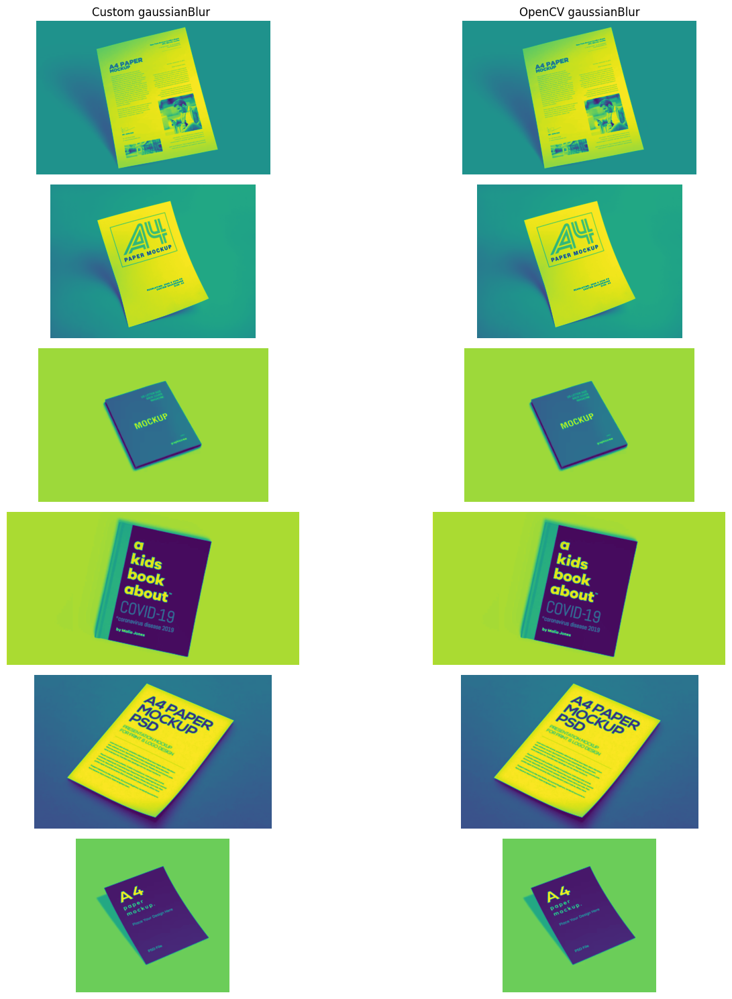

In [ ]:
images = zip(gaussianBlur_py,gaussianBlur_cv)
titles = ['Custom gaussianBlur ', 'OpenCV gaussianBlur']
array_img = list(images)
ncol = 2
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')

plt.tight_layout()
plt.show()

Độ chính xác giữa Jit và OpenCV của hàm làm làm mở ảnh và convolution

In [ ]:
gaussianBlur_accuracy = [evaluate_accuracy(gaussianBlur_cv[i], gaussianBlur_py[i]) for i in range(len(img))]
print('Độ chính xác giữa Jit và OpenCV là: ', np.mean(gaussianBlur_accuracy))

Độ chính xác giữa Jit và OpenCV là:  0.9999954699399799


#### 5.4 Hàm tính element-wise cho ma trận

In [ ]:
@jit(cache = True)
def edgeSobel(mat1, mat2):
    """
    Tính gradient cạnh của ảnh sử dụng phương pháp Sobel.

    Tham số:
    - mat1: Ma trận gradient theo trục x.
    - mat2: Ma trận gradient theo trục y.
    """
    return np.sqrt(mat1**2 + mat2**2)

@jit(cache = True)
def angleGrad(mat1, mat2):
    """
    Tính góc gradient của ảnh sử dụng phương pháp Sobel.

    Tham số:
    - mat1: Ma trận gradient theo trục x.
    - mat2: Ma trận gradient theo trục y.
    """
    out_mat = np.arctan2(mat2, mat1) * (180/np.pi)
    out_mat[out_mat < 0] += 180
    return out_mat

#### 5.5 Sobel Kernel

In [ ]:
sobel_x_kernel = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], np.float32)
sobel_y_kernel = np.array([[1,2,1],[0,0,0],[-1,-2,-1]], np.float32)

#### 5.6 Hàm tính edge gradient

In [ ]:
@jit(cache = True)
def edgeGradient(img, sobel_x_kernel, sobel_y_kernel):
    sobel_x = convolution(img,sobel_x_kernel)
    sobel_y = convolution(img,sobel_y_kernel)

    edge_sobel = edgeSobel(sobel_x, sobel_y)

    #convert radian value to degree
    angle = angleGrad(sobel_x, sobel_y)

    return edge_sobel, angle

#### 5.7 Hàm xác đinh non-max suppression

In [ ]:
@jit(cache=True)
def nonMaxSuppression(img, angle):
    rows, cols = img.shape
    suppressed = np.zeros(img.shape, np.int32)

    for r in range(1, rows - 1):
        for c in range(1, cols - 1):
            q, t = 255, 255

            if 0 <= angle[r,c] < 22.5 or 180 >= angle[r,c] >= 157.5:
                q, t = img[r, c+1], img[r, c-1]
            elif 67.5 > angle[r,c] >= 22.5:
                q, t = img[r+1, c-1], img[r-1, c+1]
            elif 112.5 > angle[r,c] >= 67.5:
                q, t = img[r+1, c], img[r-1, c]
            elif 157.5 > angle[r,c] >= 112.5:
                q, t = img[r-1, c-1], img[r+1, c+1]

            if img[r,c] >= q and img[r,c] >= t:
                suppressed[r,c] = img[r,c]
            else:
                suppressed[r,c] = 0

    return suppressed

#### 5.8 Hàm lọc ngưỡng

In [ ]:
@jit(cache=True)
def thresholding(img, min_thres, max_thres):
    max_val = np.max(img) * max_thres
    min_val = max_val * min_thres

    # Tạo mặt nạ có cùng kích thước với ảnh và các giá trị ban đầu là 0
    canny_mask = np.zeros_like(img, dtype=np.uint8)

    # Xác định các điểm có giá trị vượt ngưỡng cao
    strong_edges_mask = (img > max_val)
    canny_mask[strong_edges_mask] = 255

    # Xác định các điểm có giá trị giữa ngưỡng thấp và ngưỡng cao và có ít nhất một điểm láng giềng vượt ngưỡng cao
    weak_edges_mask = (img <= max_val) & (img > min_val)
    for x in range(img.shape[0]):
        for y in range(img.shape[1]):
            if weak_edges_mask[x, y]:
                # Kiểm tra các điểm láng giềng
                start_x, end_x = max(0, x-1), min(img.shape[0], x+2)
                start_y, end_y = max(0, y-1), min(img.shape[1], y+2)

                neighbor_values = img[start_x:end_x, start_y:end_y]
                if np.any(neighbor_values > max_val):
                    canny_mask[x, y] = 255

    return canny_mask

Thời gian để phát hiện biên cạnh theo tuần tự

In [ ]:
results = [edgeGradient(gaussianBlur_py[i], sobel_x_kernel, sobel_y_kernel) for i in range(len(img))]
edge_sobel_py = [result[0] for result in results]
angle_py = [result[1] for result in results]
non_max_sup_py = [nonMaxSuppression(edge_sobel_py[i], angle_py[i]) for i in range(len(img))]
canny_edge_py = [thresholding(non_max_sup_py[i], 0.05, 0.15).astype(np.uint8) for i in range(len(img))]

start_time = time.time()
results = [edgeGradient(gaussianBlur_py[i], sobel_x_kernel, sobel_y_kernel) for i in range(len(img))]
edge_sobel_py = [result[0] for result in results]
angle_py = [result[1] for result in results]
non_max_sup_py = [nonMaxSuppression(edge_sobel_py[i], angle_py[i]) for i in range(len(img))]
canny_edge_py = [thresholding(non_max_sup_py[i], 0.05, 0.15).astype(np.uint8) for i in range(len(img))]
end_time = time.time()

execution_canny_edge_py_time = end_time - start_time
execution_canny_edge_py_time

0.7563893795013428

Thời gian để phát hiện biên cạnh theo openCV

In [ ]:
start_time = time.time()
canny_edge_cv = [cv2.Canny(gaussianBlur_cv[i], 100, 200) for i in range(len(img))]
end_time = time.time()

execution_canny_edge_cv_time = end_time - start_time
execution_canny_edge_cv_time

0.034720420837402344

Sau khi xác định được 4 bước phát hiện biên cạnh theo **Canny edge detector** thì sau đây là ảnh phát hiện biên cạnh

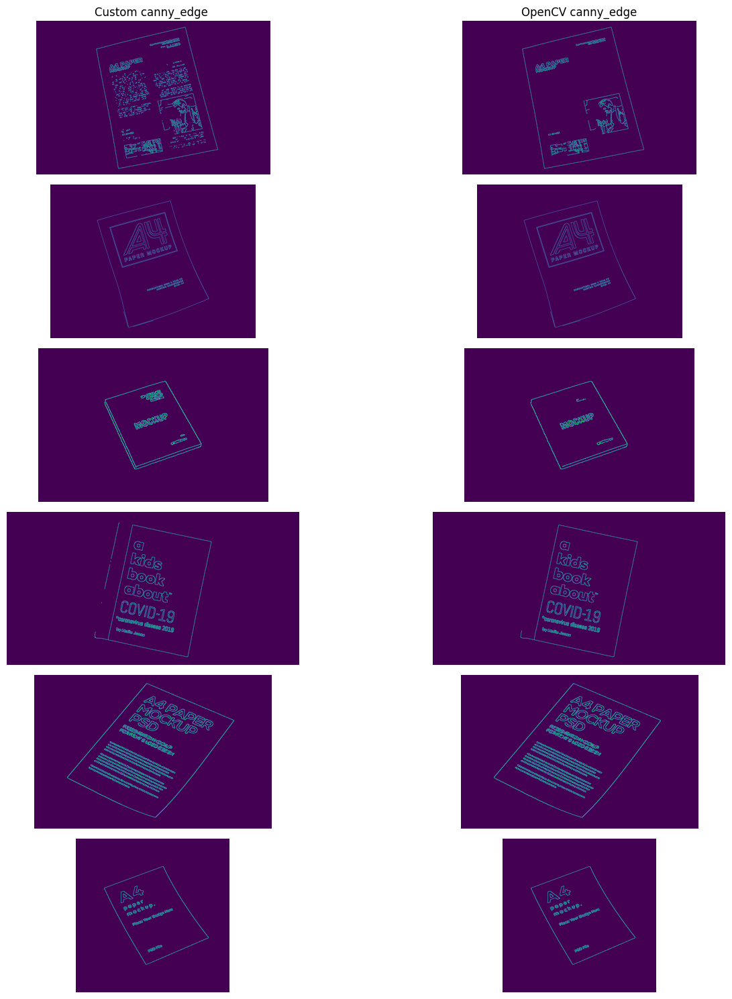

In [ ]:
images = zip(canny_edge_py,canny_edge_cv)
titles = ['Custom canny_edge ', 'OpenCV canny_edge']
array_img = list(images)
ncol = 2
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

Độ chính xác giữa Jit và OpenCV của hàm phát hiện biên cạnh

In [ ]:
canny_edge_accuracy = [evaluate_accuracy(canny_edge_py[i], canny_edge_cv[i]) for i in range(len(img))]
print('Độ chính xác giữa Jit và OpenCV là: ', np.mean(canny_edge_accuracy))

Độ chính xác giữa Jit và OpenCV là:  0.9890492130650695


#### 5.9 Hàm xác định 4 góc

In [ ]:
def get_pos(lst_can, min_val, max_val, pos=0):
    """
    Xác định các vị trí trong danh sách thỏa mãn giá trị tối thiểu và tối đa cho một trục cụ thể.

    Tham số:
    - lst_can: Danh sách các vị trí cần kiểm tra.
    - min_val: Giá trị tối thiểu.
    - max_val: Giá trị tối đa.
    - pos: Vị trí trục cần kiểm tra.

    """
    candidates = lst_can[(lst_can[:, pos] == min_val) | (lst_can[:, pos] == max_val)]

    if len(candidates) == 0:
        return lst_can[lst_can[:, pos].argmax()], -1
    elif len(candidates) == 2:
        return candidates[candidates[:, pos] == min_val][0], candidates[candidates[:, pos] == max_val][0]
    elif len(candidates) == 1:
        return candidates[candidates[:, pos] == max_val][0], -1
    else:
        return candidates[candidates[:, pos] == min_val][0], -1

In [ ]:
def find_contours(canny_egde):
    contours, _ = cv2.findContours(canny_egde, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=lambda x: cv2.arcLength(x, True), reverse=True)
    chosen_contour = contours[0].squeeze()

    max_x, max_y = chosen_contour[:, 0].max(), chosen_contour[:, 1].max()
    min_x, min_y = chosen_contour[:, 0].min(), chosen_contour[:, 1].min()

    bottom_contour, top_contour = chosen_contour[chosen_contour[:, 0] == max_x], chosen_contour[chosen_contour[:, 0] == min_x]
    left_contour, right_contour = chosen_contour[chosen_contour[:, 1] == min_y], chosen_contour[chosen_contour[:, 1] == max_y]

    top, bottom = get_pos(top_contour, min_y, max_y, 1), get_pos(bottom_contour, min_y, max_y, 1)
    left, right = get_pos(left_contour, min_x, max_x, 0), get_pos(right_contour, min_x, max_x, 0)
    return top, bottom, left, right

results = [find_contours(canny_edge) for canny_edge in canny_edge_py]
top, bottom, left, right = zip(*results)

In [ ]:

def get_points(xy, lst):
    """
    Thêm các điểm vào danh sách.

    Tham số:
    - xy: Các tọa độ cần thêm vào danh sách.
    - lst: Danh sách cần thêm vào.

    """
    if xy[1] == -1:
        lst.append(xy[0])
    else:
        lst.extend(xy)

def get_4_vertices(t, l, r, b, lst_v):
    """
    Xác định 4 điểm đỉnh từ các cạnh của hình.

    Tham số:
    - t: Cạnh trên.
    - l: Cạnh trái.
    - r: Cạnh phải.
    - b: Cạnh dưới.
    - lst_v: Danh sách chứa các điểm đỉnh.

    """
    lst = []

    get_points(list(t), lst)
    get_points(list(l), lst)
    get_points(list(r), lst)
    get_points(list(b), lst)

    lst_v.extend([point for point in lst if point not in lst_v])


@jit(cache = True)
def get_l_r(lst, pts, is_top=True):
    """
    Xác định hai điểm trái và phải từ một danh sách và một tập hợp các điểm.

    Tham số:
    - lst: Danh sách cần kiểm tra.
    - pts: Tập hợp chứa các điểm.
    - is_top: Biến bool xác định xem các điểm là trên cùng hay không.

    Trả về:
    Hai điểm trái và phải.
    """
    l = []
    for i in lst:
        for v in pts:
            if i == v[0]:
                l.append(v)
    l.sort(key=lambda x: x[1])
    if is_top:
        return l[0], l[1]
    else:
        return l[1], l[0]

In [ ]:
four_vertices_cnts_py = []
for i in range(len(top)):
    temp = []
    get_4_vertices(top[i], left[i], right[i], bottom[i], temp)
    four_vertices_cnts_py.append(temp)

In [ ]:
@jit(cache = True)
def order_points_py(pts):
    """
    Sắp xếp các điểm theo thứ tự cụ thể.

    Tham số:
    - pts: Danh sách các điểm cần sắp xếp.

    Trả về:
    Danh sách các điểm đã được sắp xếp.
    """
    t, b = np.sort(pts[:, 0])[:2], np.sort(pts[:, 0])[2:]

    order_vertices = []
    order_vertices.extend(list(get_l_r(t, pts)))
    order_vertices.extend(list(get_l_r(b, pts, False)))

    return np.array(order_vertices)

In [ ]:
four_vertices_cnts_py = [order_points_py(np.array(x)) for x in four_vertices_cnts_py]#, max_x, max_y, min_x, min_y)

In [ ]:
def calculate_dimensions(vertices):
    top_left, top_right, bottom_right, bottom_left = vertices
    widthA = ((bottom_right[0] - bottom_left[0]) ** 2 + (bottom_right[1] - bottom_left[1]) ** 2) ** 0.5
    widthB = ((top_right[0] - top_left[0]) ** 2 + (top_right[1] - top_left[1]) ** 2) ** 0.5
    maxWidth_py = int(widthA) if int(widthA) > int(widthB) else int(widthB)

    heightA = ((top_right[0] - bottom_right[0]) ** 2 + (top_right[1] - bottom_right[1]) ** 2) ** 0.5
    heightB = ((top_left[0] - bottom_left[0]) ** 2 + (top_left[1] - bottom_left[1]) ** 2) ** 0.5

    maxHeight_py = int(heightA) if int(heightA) > int(heightB) else int(heightB)

    return maxWidth_py, maxHeight_py

results = [calculate_dimensions(vertices) for vertices in four_vertices_cnts_py]
maxWidth_py, maxHeight_py = zip(*results)

Thời gian xác định 4 góc tuần tự

In [ ]:
output_4_points_py = [x.copy() for x in img]
start_time = time.time()
_ = [cv2.drawContours(output_4_points_py[i], [four_vertices_cnts_py[i].astype('int')], 0, (0, 255, 0), 2) for i in range(len(img))]
end_time = time.time()

execution_output_4_points_py_time = end_time - start_time
execution_output_4_points_py_time



0.0075299739837646484

In [ ]:
def order_points_np(pts):
    """
    Sắp xếp các điểm theo thứ tự cụ thể.

    Tham số:
    - pts: Danh sách các điểm cần sắp xếp.

    Trả về:
    Danh sách các điểm đã được sắp xếp.
    """
    rect = np.zeros((4, 2), dtype="float32")

    # Tính tổng các tọa độ của mỗi điểm
    s = pts.sum(axis=1)
    # Lấy điểm có tổng nhỏ nhất và lớn nhất
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]

    # Tính hiệu giữa hai tọa độ của mỗi điểm
    diff = np.diff(pts, axis=1)
    # Lấy điểm có hiệu nhỏ nhất và lớn nhất
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]

    return rect

In [ ]:
results = [find_contours(canny_edge) for canny_edge in canny_edge_cv]
top, bottom, left, right = zip(*results)

In [ ]:
four_vertices_cnts_cv = []
for i in range(len(top)):
    temp = []
    get_4_vertices(top[i], left[i], right[i], bottom[i], temp)
    four_vertices_cnts_cv.append(temp)

In [ ]:
four_vertices_cnts_cv = [order_points_np(np.array(x)) for x in four_vertices_cnts_cv]

In [ ]:
results = [calculate_dimensions(vertices) for vertices in four_vertices_cnts_cv]
maxWidth_cv, maxHeight_cv = zip(*results)

Thời gian xác định 4 góc openCV

In [ ]:
output_4_points_cv = [x.copy() for x in img]

start_time = time.time()
_ = [cv2.drawContours(output_4_points_cv[i], [four_vertices_cnts_cv[i].astype('int')], 0, (0, 255, 0), 2) for i in range(len(img))]
end_time = time.time()

execution_output_4_points_cv_time = end_time - start_time
execution_output_4_points_cv_time

0.005304098129272461

Ảnh sau khi xác định được 4 góc

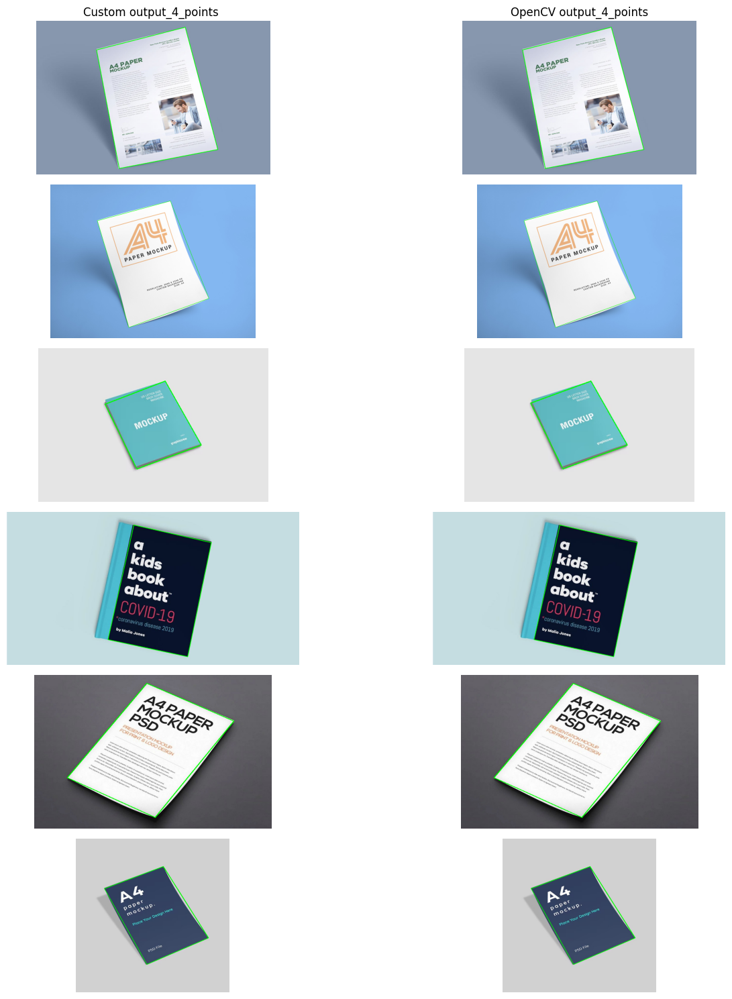

In [ ]:
images = zip(output_4_points_py,output_4_points_cv)
titles = ['Custom output_4_points ', 'OpenCV output_4_points']
array_img = list(images)
ncol = 2
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

Độ chính xác giữa Jit và OpenCV của hàm xác định 4 góc

In [ ]:
output_4_points_accuracy = [evaluate_accuracy(output_4_points_py[i], output_4_points_cv[i]) for i in range(len(img))]
print('Độ chính xác giữa Jit và OpenCV là: ', np.mean(output_4_points_accuracy))

Độ chính xác giữa Jit và OpenCV là:  0.9975225677629361


#### 5.10 Hàm xác định các tọa độ mới cho ảnh

In [ ]:
@jit(cache=True)
def map_pos_homography(img, new_i, H):
    """
    Ánh xạ các điểm trong ảnh mới đến ảnh gốc bằng ma trận homography.

    Tham số:
    - img: Ảnh gốc.
    - new_i: Ảnh mới cần ánh xạ.
    - H: Ma trận homography.

    Trả về:
    Ảnh mới đã được ánh xạ từ ảnh gốc.
    """
    new_img = new_i.copy()
    for r in range(new_img.shape[0]):
        for c in range(new_img.shape[1]):
            # Tính toán tọa độ mới dựa trên ma trận homography
            x = (H[0, 0] * c + H[0, 1] * r + H[0, 2]) / (H[2, 0] * c + H[2, 1] * r + H[2, 2])
            y = (H[1, 0] * c + H[1, 1] * r + H[1, 2]) / (H[2, 0] * c + H[2, 1] * r + H[2, 2])
            # Làm tròn tọa độ
            x = int(x + 0.5)
            y = int(y + 0.5)
            # Kiểm tra xem tọa độ mới có nằm trong phạm vi ảnh gốc không
            if 0 <= y < img.shape[0] and 0 <= x < img.shape[1]:
                new_img[r, c] = img[y, x]
    return new_img


In [ ]:
n_four_vertices_cnts_py = [np.array([[0,0], [0, maxWidth_py[i]-1], [maxHeight_py[i]-1, maxWidth_py[i] - 1], [maxHeight_py[i] - 1, 0]], dtype = 'float32') for i in range(len(img))]
H_py = [np.linalg.inv(cv2.getPerspectiveTransform(four_vertices_cnts_py[i].astype('float32'), n_four_vertices_cnts_py[i])) for i in range(len(img))]

Thời gian của hàm xác định tọa độ mới tuần tự

In [ ]:
new_i = [np.zeros((maxHeight_cv[i], maxWidth_cv[i], img[i].shape[-1]), img[i].dtype) for i in range(len(img))]
homo_img_py = [map_pos_homography(img[i], new_i[i], H_py[i]).astype(int) for i in range(len(img))]

start_time = time.time()
homo_img_py = [map_pos_homography(img[i], new_i[i], H_py[i]).astype(int) for i in range(len(img))]
end_time = time.time()

execution_homo_img_py_time = end_time - start_time
execution_homo_img_py_time

0.03719329833984375

In [ ]:
n_four_vertices_cnts_cv = [np.array([[0, 0],[maxWidth_cv[i] - 1, 0],[maxWidth_cv[i] - 1, maxHeight_cv[i] - 1],[0, maxHeight_cv[i] - 1]], dtype = "float32") for i in range(len(maxWidth_cv))]
H_cv = [cv2.getPerspectiveTransform(four_vertices_cnts_cv[i].astype('float32'), n_four_vertices_cnts_cv[i]) for i in range(len(n_four_vertices_cnts_cv))]

Thời gian của hàm xác định tọa độ mới openCV

In [ ]:
start_time = time.time()
homo_img_cv = [cv2.warpPerspective(img[i], H_cv[i], (maxWidth_cv[i], maxHeight_cv[i])) for i in range(len(img))]
end_time = time.time()

execution_homo_img_cv_time = end_time - start_time
execution_homo_img_cv_time

0.0493321418762207

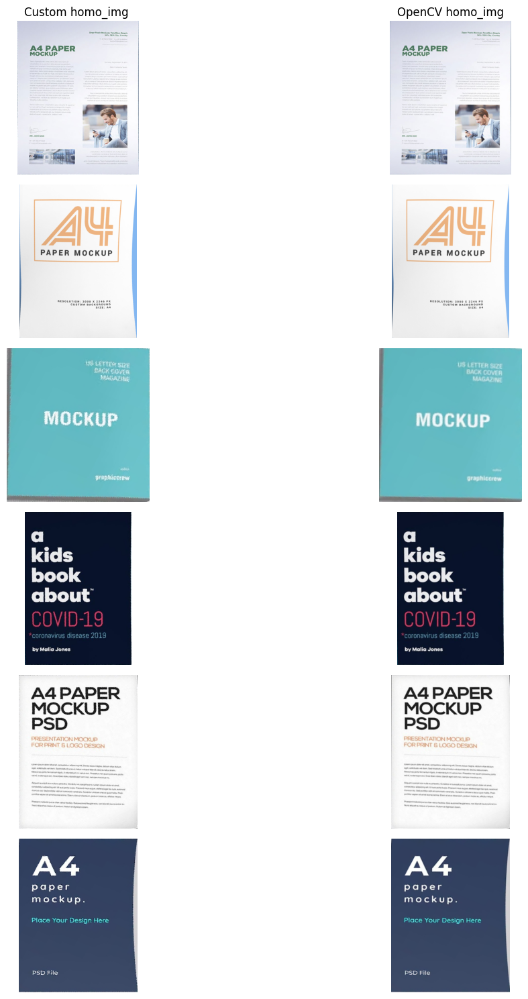

In [ ]:
images = zip(homo_img_py, homo_img_cv)
titles = ['Custom homo_img ', 'OpenCV homo_img']
array_img = list(images)
ncol = 2
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

Độ chính xác giữa Jit và OpenCV của hàm xác định tọa độ mới

In [ ]:
homo_img_accuracy = [evaluate_accuracy(homo_img_py[i], homo_img_cv[i]) for i in range(len(img))]
print('Độ chính xác giữa Jit và OpenCV là: ', np.mean(homo_img_accuracy))

Độ chính xác giữa Jit và OpenCV là:  0.9558051102568833


#### 5.11 Hàm điều chỉnh độ sáng, độ tương phản

In [ ]:
def controller(img, brightness=255, contrast=127):
    brightness = int((brightness - 0) * (255 - (-255)) / (510 - 0) + (-255))
    contrast = int((contrast - 0) * (127 - (-127)) / (254 - 0) + (-127))

    alpha = 1.0 + float(contrast) / 100
    beta = float(brightness)

    adjusted_image = cv2.convertScaleAbs(img, alpha=alpha, beta=beta)
    return adjusted_image

#### 5.12 Hàm xoay, lật ảnh

In [ ]:
@jit(cache=True)
def flipImg(img, axis=1): #1: y, 0: x
    """
    Lật ảnh theo trục x hoặc y.

    Tham số:
    - img: Ảnh cần lật.
    - axis: Trục lật, 1 để lật theo trục y, 0 để lật theo trục x.
    """
    if axis == 1:
        new_img = img[:, ::-1]
    else:
        new_img = img[::-1, :]
    return new_img

@jit(cache=True)
def rotImg(img, clockwise=True):
    """
    Xoay ảnh 90 độ theo chiều kim đồng hồ hoặc ngược chiều kim đồng hồ.

    Tham số:
    - img: Ảnh cần xoay.
    - clockwise: True để xoay theo chiều kim đồng hồ, False để xoay ngược chiều kim đồng hồ.

    Trả về:
    Ảnh đã được xoay.
    """
    if clockwise:
        new_img = np.rot90(img, k=-1)
    else:
        new_img = np.rot90(img)
    return new_img

In [ ]:
brightness = 200
contrast = 140

Thời gian làm mới ảnh tuần tự

In [ ]:
in_adjust = [homo_img_py[i].copy() for i in range(len(img))]

start_time = time.time()
new_image_py = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
end_time = time.time()

execution_new_image_py_time = end_time - start_time
execution_new_image_py_time
# flip_img_py = flipImg(new_image_py, 1)

0.005774736404418945

Thời gian làm mới ảnh openCV

In [ ]:
in_adjust = [homo_img_cv[i].copy() for i in range(len(img))]

start_time = time.time()
new_image_cv = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
end_time = time.time()

execution_new_image_cv_time = end_time - start_time
execution_new_image_cv_time



0.0016133785247802734

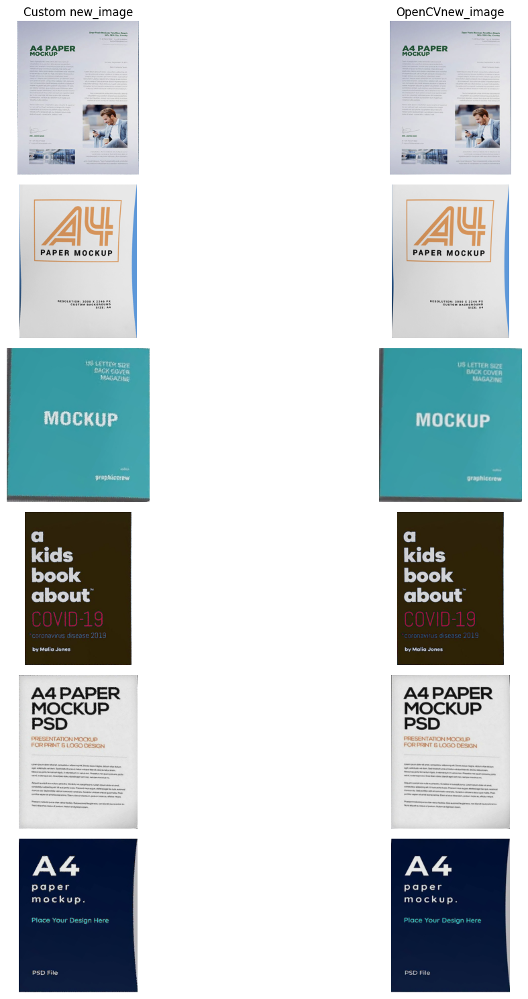

In [ ]:
images = zip(new_image_py,new_image_cv)
titles = ['Custom new_image', 'OpenCVnew_image']
array_img = list(images)
ncol = 2
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

Độ chính xác giữa Jit và OpenCV của hàm làm mới ảnh

In [ ]:
new_image_accuracy = [evaluate_accuracy(new_image_py[i], new_image_cv[i]) for i in range(len(img))]
print('Độ chính xác giữa Jit và OpenCV là: ', np.mean(new_image_accuracy))

Độ chính xác giữa Jit và OpenCV là:  0.9509202586158617


#### Tổng hợp

##### Thời gian


In [ ]:
time_name = ['Gray','GaussianBlur','Canny_edge','Output_4_points','Homo_img','New_image']
cv = [execution_gray_cv_time, execution_gaussianBlur_cv_time, execution_canny_edge_cv_time, execution_output_4_points_cv_time,execution_homo_img_cv_time,execution_new_image_cv_time]
py = [execution_gray_py_time, execution_gaussianBlur_py_time, execution_canny_edge_py_time,execution_output_4_points_py_time,execution_homo_img_py_time,execution_new_image_py_time]

time_cv = pd.DataFrame(data = cv, index = time_name, columns = ['OpenCV (s)'])
time_py = pd.DataFrame(data = py, index = time_name, columns = ['@jit (s)'])

time = pd.concat([time_py, time_cv], axis=1)
time.columns = ['@jit (s)','OpenCV (s)']
time.loc['Total Time']= time.sum(numeric_only=True, axis=0)
time

,@jit (s),OpenCV (s)
Gray,0.019715,0.026791
GaussianBlur,0.146954,0.014289
Canny_edge,0.756389,0.034720
Output_4_points,0.007530,0.005304
Homo_img,0.037193,0.049332
New_image,0.005775,0.001613
Total Time,0.973557,0.132051


##### Hình ảnh

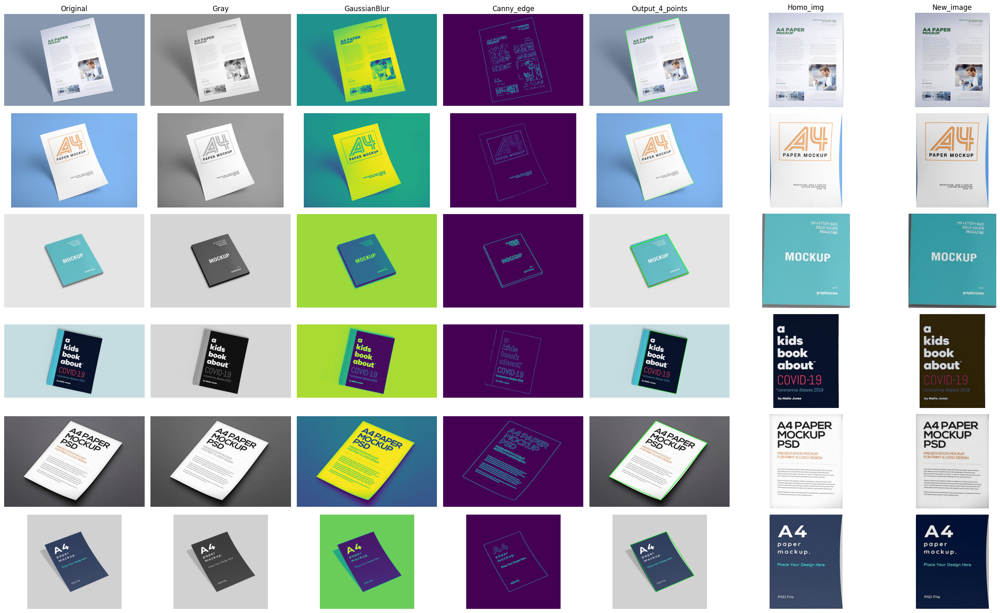

In [ ]:
images = zip(img, gray_py, gaussianBlur_py, canny_edge_py, output_4_points_py, homo_img_py, new_image_py)
titles = ['Original', 'Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
array_img = list(images)
ncol = 7
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(25,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        if j == 1:
            ax.imshow(array_img[i][j], cmap='gray')
        else:
            ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

##### Độ chính xác

In [ ]:
all_accuracy = [gray_accuracy, gaussianBlur_accuracy, canny_edge_accuracy, output_4_points_accuracy, homo_img_accuracy, new_image_accuracy]
titles = ['Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']

for title, accuracy in zip(titles, all_accuracy):
    print(f"Độ chính xác @Jit {title}: {np.mean(accuracy)}")


Độ chính xác @Jit Gray: 0.9999999903029589
Độ chính xác @Jit GaussianBlur: 0.9999954699399799
Độ chính xác @Jit Canny_edge: 0.9890492130650695
Độ chính xác @Jit Output_4_points: 0.9975225677629361
Độ chính xác @Jit Homo_img: 0.9558051102568833
Độ chính xác @Jit New_image: 0.9509202586158617


### 6. Cài đặt song song:

#### 6.1 Phân tích

Vì các hàm xác định tọa độ, hàm chỉnh độ tương phản, độ sáng của ảnh có thời gian khá thấp do khối lượng công việc ít nên em sử dụng luôn hàm của thư viện hoặc sử dụng của cài đặt tuần tự.

Ta sẽ thực hiện song song hóa các hàm sau:

- Hàm làm xám ảnh
- Convolution kernel
- Hàm tính gradient và hướng gradient
- Hàm tính các tọa độ mới
- Hàm non-max suppression
- Hàm lọc ngưỡng



- Vì các pixel trong mảng output sẽ được tính độc lập (không phụ thuộc vào các pixel khác) $\rightarrow$ Một thread sẽ xử lý một pixel tương ứng.

- Toàn bộ ma trận input sẽ được chia thành một grid với kích thước (m,n) và mỗi grid sẽ có blocksize là (32,32) vì số lượng thread tối đa của mỗi block là 1024.

In [ ]:
block_size = (32,32)

#### 6.2 Hàm làm xám ảnh

In [ ]:
@cuda.jit
def convert_RGB_To_Gray_cuda(img_in, img_out):
    cols, rows = cuda.grid(2)
    if rows < img_in.shape[0] and cols < img_in.shape[1]:
        img_out[rows,cols] =  round(img_in[rows,cols,0] * 0.2989  + img_in[rows,cols,1] * 0.5870 + img_in[rows,cols,2] * 0.1141)

Ảnh sau khi làm xám

In [ ]:
gray_cuda = [np.zeros((img[i].shape[0], img[i].shape[1])) for i in range(len(img))]

grid_size = [(math.ceil(gray_cuda[i].shape[1] / block_size[0]), #chieu x
             math.ceil(gray_cuda[i].shape[0] / block_size[1])) for i in range(len(img))] #chieu y


In [ ]:
import time

Thời gian làm xám ảnh song song

In [ ]:
for i in range(len(img)):
    convert_RGB_To_Gray_cuda[grid_size[i], block_size](img[i].copy(), gray_cuda[i])

start_time = time.time()
for i in range(len(img)):
    convert_RGB_To_Gray_cuda[grid_size[i], block_size](img[i].copy(), gray_cuda[i])
end_time = time.time()

execution_gray_cuda_time = end_time - start_time
execution_gray_cuda_time

0.03453564643859863

Ảnh sau khi làm xám

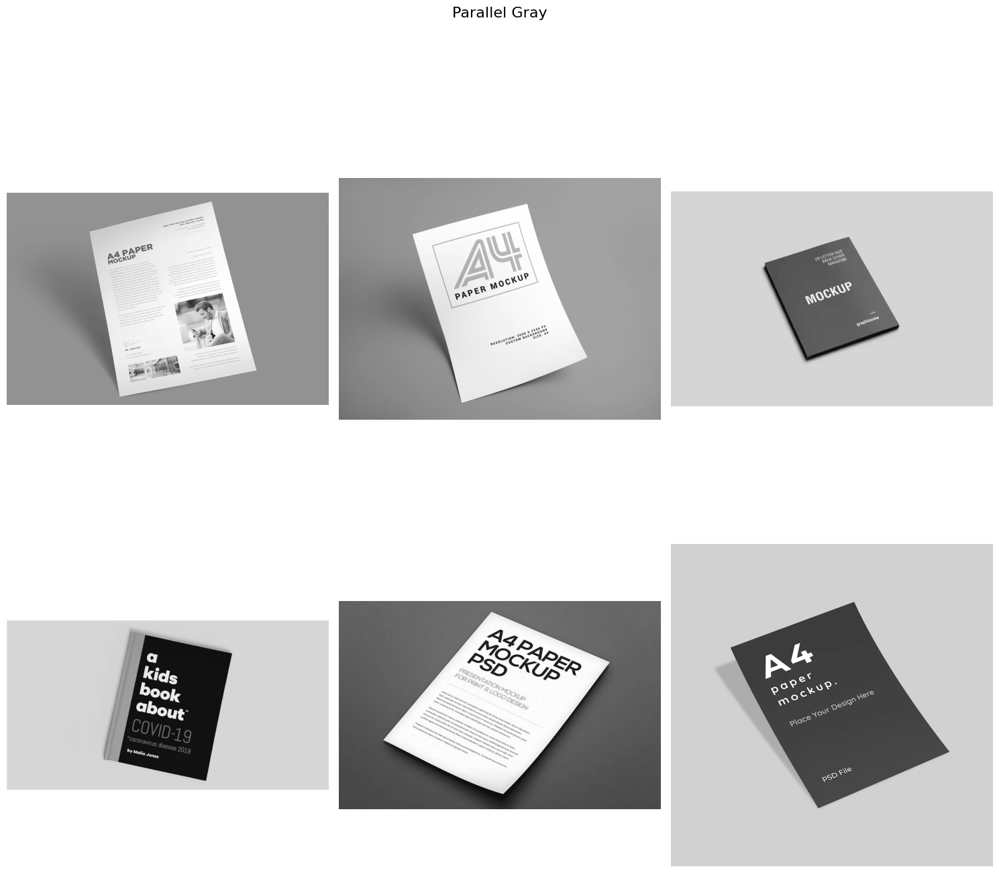

In [ ]:
ncol = math.ceil(len(img) / 2)
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
img_idx = 0
for i in range(nrow):
    for j in range(ncol):
        if img_idx < len(img):
            ax = axes[i, j]
            ax.imshow(gray_cuda[img_idx], cmap='gray')
            img_idx += 1
            ax.axis('off')
        else:
            axes[i, j].axis('off')

fig.suptitle('Parallel Gray', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
def evaluate_accuracy(cv, cuda):
    ssim_score = ssim(cv, cuda, data_range=255, channel_axis=-1)
    return ssim_score


Độ chính xác giữa Cuda và OpenCV của hàm làm xám

In [ ]:
gray_cuda_accuracy = [evaluate_accuracy(gray_cuda[i], gray_cv[i]) for i in range(len(img))]
print('Độ chính xác giữa Cuda và OpenCV là: ', np.mean(gray_cuda_accuracy))

Độ chính xác giữa Cuda và OpenCV là:  0.9999999903029589


#### 6.3 Convolution kernel

In [ ]:
@cuda.jit
def convolution_cuda(img_in, img_out, kernel):
    c, r = cuda.grid(2)

    # Kiểm tra xem chỉ số hàng và cột của thread có nằm trong kích thước ảnh không
    if r < img_in.shape[0] and c < img_in.shape[1]:
        result = 0

        # Duyệt qua các phần tử trong kernel
        for i in range(kernel.shape[0]):
            for j in range(kernel.shape[1]):
                # Tính toán chỉ số hàng và cột trong ảnh gốc dựa trên kernel và vị trí hiện tại của thread
                in_r = r - kernel.shape[0] // 2 + i
                in_c = c - kernel.shape[1] // 2 + j

                # Giới hạn chỉ số hàng và cột trong phạm vi của ảnh gốc
                in_r = min(max(0, in_r), img_in.shape[0] - 1)
                in_c = min(max(0, in_c), img_in.shape[1] - 1)

                # Tính tổng convolution
                result += kernel[i, j] * img_in[in_r, in_c]

        # Gán giá trị convolution đã tính được vào ảnh output, làm tròn kết quả
        img_out[r, c] = round(result)


In [ ]:
gaussian_cuda = [np.zeros(gray_cuda[i].shape) for i in range(len(img))]
gau_kernel_size = 3
gau_kernel = gaussian_kernel(gau_kernel_size,1)

Thời gian làm mờ ảnh song song

In [ ]:
for i in range(len(img)):
    convolution_cuda[grid_size[i], block_size](gray_cuda[i], gaussian_cuda[i], gau_kernel)

start_time = time.time()
for i in range(len(img)):
    convolution_cuda[grid_size[i], block_size](gray_cuda[i], gaussian_cuda[i], gau_kernel)
end_time = time.time()

execution_gaussianBlur_cuda_time = end_time - start_time
execution_gaussianBlur_cuda_time

0.05579876899719238

Ảnh sau khi làm mờ

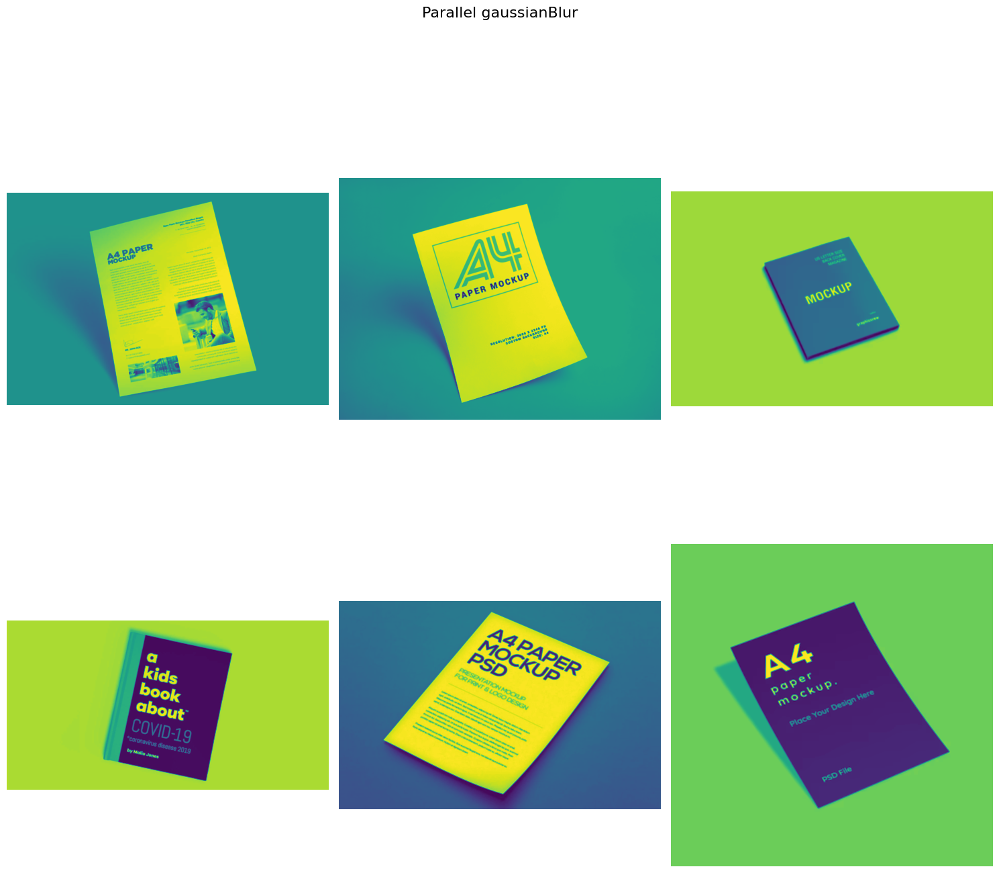

In [ ]:
ncol = math.ceil(len(img) / 2)
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
img_idx = 0
for i in range(nrow):
    for j in range(ncol):
        if img_idx < len(img):
            ax = axes[i, j]
            ax.imshow(gaussian_cuda[img_idx])
            img_idx += 1
            ax.axis('off')
        else:
            axes[i, j].axis('off')

fig.suptitle('Parallel gaussianBlur', fontsize=16)
plt.tight_layout()
plt.show()

Độ chính xác giữa Cuda và OpenCV của hàm làm mờ

In [ ]:
gaussianBlur_cuda_accuracy = [evaluate_accuracy(gaussianBlur_cv[i], gaussian_cuda[i]) for i in range(len(img))]
print('Độ chính xác giữa Cuda và OpenCV là: ', np.mean(gaussianBlur_cuda_accuracy))

Độ chính xác giữa Cuda và OpenCV là:  0.9999954699399799


#### 6.4 Hàm tính gradient và hướng gradient

In [ ]:
@cuda.jit
def gradient_cuda(img_in, img_out, angle, kernel_x, kernel_y):
    """
    Tính toán gradient và hướng gradient của mỗi pixel trong ảnh đầu vào.

    Tham số:
    - img_in: Ảnh đầu vào.
    - img_out: Ma trận chứa gradient của mỗi pixel.
    - angle: Ma trận chứa hướng gradient của mỗi pixel.
    - kernel_x: Ma trận kernel cho gradient theo phương x.
    - kernel_y: Ma trận kernel cho gradient theo phương y.

    """
    c, r = cuda.grid(2)
    if r < img_in.shape[0] and c < img_in.shape[1]:
        # Khởi tạo giá trị gradient và hướng gradient
        result_x = 0
        result_y = 0
        # Tính toán gradient bằng cách áp dụng kernel
        for i in range(kernel_x.shape[0]):
            for j in range(kernel_x.shape[1]):
                in_r = r - kernel_x.shape[0] // 2 + i
                in_c = c - kernel_x.shape[1] // 2 + j
                in_r = min(max(0, in_r), img_in.shape[0] - 1)
                in_c = min(max(0, in_c), img_in.shape[1] - 1)
                result_x += kernel_x[i, j] * img_in[in_r, in_c]
                result_y += kernel_y[i, j] * img_in[in_r, in_c]
        # Tính toán magnitude và hướng của gradient
        img_out[r, c] = ((result_x ** 2) + (result_y ** 2)) ** 0.5
        angle[r, c] = math.atan2(result_y, result_x) * (180 / np.pi)
        angle[r, c] = angle[r, c] if angle[r, c] >= 0 else angle[r, c] + 180

In [ ]:
edge_grad_cuda = [np.zeros(gray_cuda[i].shape) for i in range(len(img))]
angle_cuda = [np.zeros(gray_cuda[i].shape) for i in range(len(img))]

Thời gian hàm tính gradient và hướng gradient song song

In [ ]:
for i in range(len(img)):
    gradient_cuda[grid_size[i], block_size](gaussian_cuda[i], edge_grad_cuda[i], angle_cuda[i], sobel_x_kernel, sobel_y_kernel)

start_time = time.time()
for i in range(len(img)):
    gradient_cuda[grid_size[i], block_size](gaussian_cuda[i], edge_grad_cuda[i], angle_cuda[i], sobel_x_kernel, sobel_y_kernel)
end_time = time.time()

execution_gradient_cuda_time = end_time - start_time
execution_gradient_cuda_time

0.22841787338256836

#### 6.5 Hàm non-max suppression

In [ ]:
@cuda.jit
def nonMaxSuppression_cuda(img_in, img_out, angle):
    c,r = cuda.grid(2)
    if 0 < r < img_in.shape[0] - 1 and 0 < c < img_in.shape[1]-1:
        q, t = 255, 255
        if 0 <= angle[r,c] < 22.5 or 180 >= angle[r,c] >= 157.5:
            q, t = img_in[r, c+1], img_in[r, c-1]
        elif 67.5 > angle[r,c] >= 22.5:
            q, t = img_in[r+1, c-1], img_in[r-1, c+1]
        elif 112.5 > angle[r,c] >= 67.5:
            q, t = img_in[r+1, c], img_in[r-1, c]
        elif 157.5 > angle[r,c] >= 112.5:
            q, t = img_in[r-1, c-1], img_in[r+1, c+1]

        if img_in[r,c] >=q and img_in[r,c] >=t:
            img_out[r,c] = img_in[r,c]
        else:
            img_out[r,c] = 0

In [ ]:
non_max_cuda = [np.zeros(edge_grad_cuda[i].shape) for i in range(len(img))]


Thời gian tính non-max suppression song song

In [ ]:
for i in range(len(img)):
    nonMaxSuppression_cuda[grid_size[i], block_size](edge_grad_cuda[i], non_max_cuda[i], angle_cuda[i])

start_time = time.time()
for i in range(len(img)):
    nonMaxSuppression_cuda[grid_size[i], block_size](edge_grad_cuda[i], non_max_cuda[i], angle_cuda[i])
end_time = time.time()

execution_nonMaxSuppression_cuda_time = end_time - start_time
execution_nonMaxSuppression_cuda_time

0.12151098251342773

#### 6.6 Hàm lọc ngưỡng

In [ ]:
@cuda.jit
def findMax(result, values):
    i,j = cuda.grid(2)
    if i < values.shape[1] and j < values.shape[0]:
        cuda.atomic.max(result, 0, values[j,i])

In [ ]:
@cuda.jit
def thresholding_cuda(img_in, img_out, min_val, max_val):
    # Lấy chỉ số của thread
    c, r = cuda.grid(2)

    # Kiểm tra xem chỉ số của thread có nằm trong kích thước ảnh không
    if r < img_in.shape[0] and c < img_in.shape[1]:
        # Nếu giá trị pixel lớn hơn ngưỡng cao, đánh dấu là cạnh
        if img_in[r, c] > max_val:
            img_out[r, c] = 255
        # Nếu giá trị pixel nằm giữa ngưỡng thấp và ngưỡng cao
        elif img_in[r, c] > min_val:
            # Khởi tạo cờ đánh dấu cho việc xác định cạnh
            is_edge = False
            # Duyệt qua các pixel lân cận
            for i in range(max(0, r - 1), min(img_in.shape[0], r + 2)):
                for j in range(max(0, c - 1), min(img_in.shape[1], c + 2)):
                    # Nếu có pixel lân cận lớn hơn ngưỡng cao, đánh dấu là cạnh
                    if img_in[i, j] > max_val:
                        is_edge = True
                        img_out[r, c] = 255
                        break
                if is_edge:
                    break
        # Nếu giá trị pixel nhỏ hơn hoặc bằng ngưỡng thấp, không phải cạnh
        else:
            img_out[r, c] = 0


In [ ]:
max_val_cuda = [np.zeros(1, dtype=non_max_cuda[i].dtype) for i in range(len(img))]


Thời gian tính điểm cực đại song song

In [ ]:
for i in range(len(img)):
    findMax[grid_size[i], block_size](max_val_cuda[i], non_max_cuda[i])

start_time = time.time()
for i in range(len(img)):
    findMax[grid_size[i], block_size](max_val_cuda[i], non_max_cuda[i])
end_time = time.time()

execution_findMax_time = end_time - start_time
execution_findMax_time

0.06691646575927734

In [ ]:
min_thres = 0.05
max_thres = 0.15

max_val = [x * max_thres for x in max_val_cuda]
min_val = [x * min_thres for x in max_val]

canny_edge_cuda = [np.zeros(non_max_cuda[i].shape, np.int32) for i in range(len(img))]
canny_edge_cuda  = [canny_edge_cuda[i].astype(np.uint8) for i in range(len(img))]

max_val = np.concatenate(max_val)
min_val = np.concatenate(min_val)

Thời gian tổng phát hiện biên cạnh song song

In [ ]:
for i in range(len(img)):
    thresholding_cuda[grid_size[i], block_size](non_max_cuda[i], canny_edge_cuda[i], min_val[i], max_val[i])

start_time = time.time()
for i in range(len(img)):
    thresholding_cuda[grid_size[i], block_size](non_max_cuda[i], canny_edge_cuda[i], min_val[i], max_val[i])
end_time = time.time()

execution_canny_edge_cuda_time = (end_time - start_time) + execution_gradient_cuda_time + execution_nonMaxSuppression_cuda_time + execution_findMax_time
execution_canny_edge_cuda_time

0.48126888275146484

Ảnh sau khi phát hiện biên cạnh

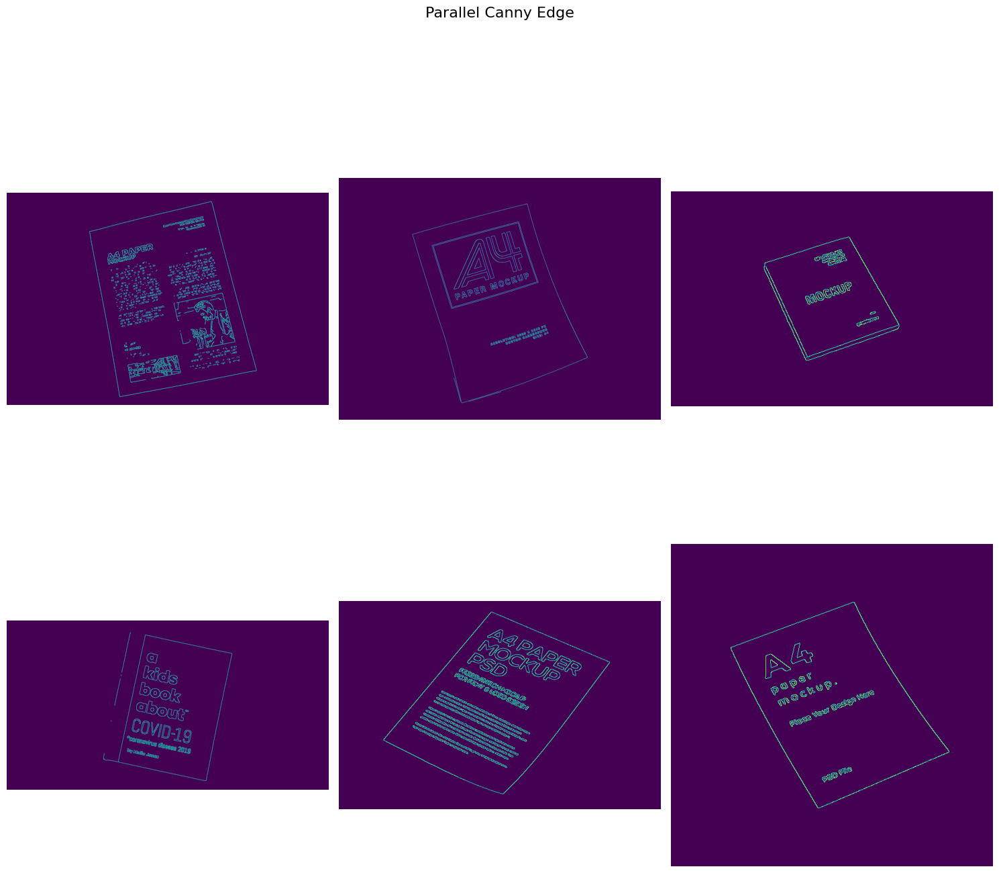

In [ ]:
ncol = math.ceil(len(img) / 2)
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
img_idx = 0
for i in range(nrow):
    for j in range(ncol):
        if img_idx < len(img):
            ax = axes[i, j]
            ax.imshow(canny_edge_cuda[img_idx])
            img_idx += 1
            ax.axis('off')
        else:
            axes[i, j].axis('off')

fig.suptitle('Parallel Canny Edge', fontsize=16)
plt.tight_layout()
plt.show()

Độ chính xác giữa Cuda và OpenCV của hàm phát hiện biên cạnh

In [ ]:
canny_edge_cuda_accuracy = [evaluate_accuracy(canny_edge_cv[i], canny_edge_cuda[i]) for i in range(len(img))]
print('Độ chính xác giữa Cuda và OpenCV là: ', np.mean(canny_edge_cuda_accuracy))

Độ chính xác giữa Cuda và OpenCV là:  0.9888555309306412


#### 6.7 Hàm xác định 4 đỉnh

In [ ]:
def transform_to_max_rectangle(img):
    cnts_jit, _ = cv2.findContours(img.astype(np.uint8), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    cnts_jit = sorted(cnts_jit, key = lambda x: cv2.arcLength(x,True), reverse = True)
    choosen_cnt = cnts_jit[0].squeeze()

    max_x, max_y = choosen_cnt[:,0].max(),choosen_cnt[:,1].max()
    min_x, min_y = choosen_cnt[:,0].min(), choosen_cnt[:,1].min()

    b_can, t_can = choosen_cnt[choosen_cnt[:,0] == max_x], choosen_cnt[choosen_cnt[:,0] == min_x]
    l_can, r_can = choosen_cnt[choosen_cnt[:,1] == min_y], choosen_cnt[choosen_cnt[:,1] == max_y]

    t, b = get_pos(t_can, min_y, max_y, 1), get_pos(b_can, min_y, max_y, 1)
    l, r = get_pos(l_can, min_x, max_x, 0), get_pos(r_can, min_x, max_x, 0)

    four_vertices_cnts_cuda = []

    get_4_vertices(t, l, r, b, four_vertices_cnts_cuda)

    four_vertices_cnts_cuda = order_points_py(np.array(four_vertices_cnts_cuda))#, max_x, max_y, min_x, min_y)

    tl, tr, br, bl = four_vertices_cnts_cuda
    widthA = ((br[0] - bl[0]) ** 2 + (br[1] - bl[1]) ** 2) ** 0.5
    widthB = ((tr[0] - tl[0]) ** 2 + (tr[1] - tl[1]) ** 2) ** 0.5

    maxWidth = int(widthA) if int(widthA) > int(widthB) else int(widthB)

    heightA = ((tr[0] - br[0]) ** 2 + (tr[1] - br[1]) ** 2) ** 0.5
    heightB = ((tl[0] - bl[0]) ** 2 + (tl[1] - bl[1]) ** 2) ** 0.5

    maxHeight = int(heightA) if int(heightA) > int(heightB) else int(heightB)
    n_four_vertices_cnts_cuda = np.array([[0,0], [0, maxWidth-1], [maxHeight-1, maxWidth - 1], [maxHeight - 1, 0]], dtype = 'float32')
    H_cuda = np.linalg.inv(cv2.getPerspectiveTransform(four_vertices_cnts_cuda.astype('float32'), n_four_vertices_cnts_cuda))
    return H_cuda, maxWidth, maxHeight, four_vertices_cnts_cuda.astype('int')

H_cuda, maxWidth, maxHeight, four_vertices_cnts_cuda = [], [], [], []
for i in range(len(img)):
    temp_H_cuda, temp_maxWidth, temp_maxHeight, temp_four_vertices_cnts_cuda = transform_to_max_rectangle(canny_edge_cuda[i])
    H_cuda.append(temp_H_cuda)
    maxWidth.append(temp_maxWidth)
    maxHeight.append(temp_maxHeight)
    four_vertices_cnts_cuda.append(temp_four_vertices_cnts_cuda)

output_4_points_cuda = [x.copy() for x in img]



Thời gian xác định 4 góc song song

In [ ]:
start_time = time.time()
_ = [cv2.drawContours(output_4_points_cuda[i], [four_vertices_cnts_cuda[i]], 0, (0, 255, 0), 2) for i in range(len(img))]
end_time = time.time()

execution_output_4_points_cuda_time = end_time - start_time
execution_output_4_points_cuda_time

0.0024080276489257812

Ảnh sau khi phát hiện 4 đỉnh

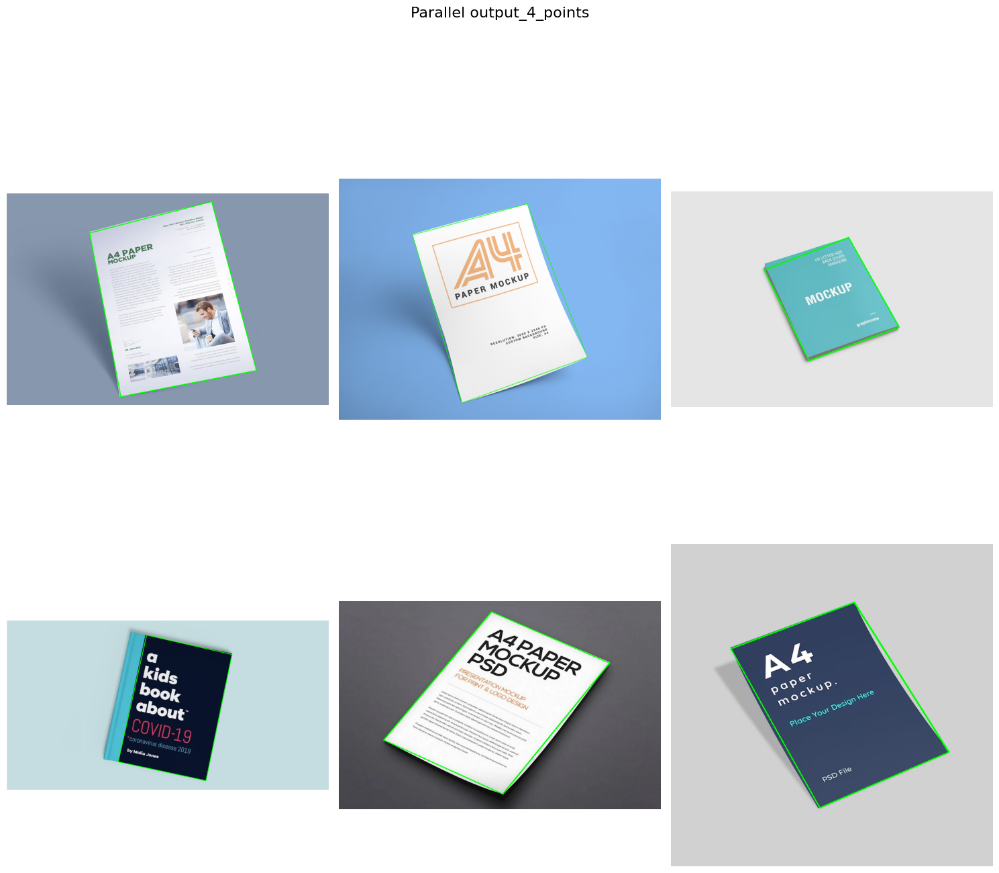

In [ ]:
ncol = math.ceil(len(img) / 2)
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
img_idx = 0
for i in range(nrow):
    for j in range(ncol):
        if img_idx < len(img):
            ax = axes[i, j]
            ax.imshow(output_4_points_cuda[img_idx])
            img_idx += 1
            ax.axis('off')
        else:
            axes[i, j].axis('off')

fig.suptitle('Parallel output_4_points', fontsize=16)
plt.tight_layout()
plt.show()

Độ chính xác giữa Cuda và OpenCV của hàm xác định 4 góc

In [ ]:
output_4_points_cuda_accuracy = [evaluate_accuracy(output_4_points_cv[i], output_4_points_cuda[i]) for i in range(len(img))]
print('Độ chính xác giữa Cuda và OpenCV là: ', np.mean(output_4_points_cuda_accuracy))

Độ chính xác giữa Cuda và OpenCV là:  0.9975225677629361


#### 6.8 Hàm xác định các tọa độ mới cho ảnh

In [ ]:
@cuda.jit
def map_homo_cuda(img_in, img_out, H):
    """
    Thực hiện ánh xạ các điểm từ ảnh đầu vào sang ảnh đầu ra bằng phép biến đổi Homography.

    Tham số:
    - img_in: Ảnh đầu vào.
    - img_out: Ảnh đầu ra sau khi ánh xạ.
    - H: Ma trận biến đổi Homography.

    """
    c, r = cuda.grid(2)
    if r < img_out.shape[0] and c < img_out.shape[1]:
        # Tính toán tọa độ mới của pixel trong ảnh đầu vào
        x = (H[0, 0] * c + H[0, 1] * r + H[0, 2]) / (H[2, 0] * c + H[2, 1] * r + H[2, 2])
        y = (H[1, 0] * c + H[1, 1] * r + H[1, 2]) / (H[2, 0] * c + H[2, 1] * r + H[2, 2])
        x = int(x) + 1 if (x * 100) % 100 >= 50 else int(x)
        y = int(y) + 1 if (y * 100) % 100 >= 50 else int(y)
        # Kiểm tra xem tọa độ mới có nằm trong phạm vi của ảnh đầu vào không
        if 0 <= y < img_in.shape[0] and 0 <= x < img_in.shape[1]:
            # Ánh xạ giá trị pixel từ ảnh đầu vào sang ảnh đầu ra
            img_out[r, c, 0] = img_in[y, x, 0]
            img_out[r, c, 1] = img_in[y, x, 1]
            img_out[r, c, 2] = img_in[y, x, 2]


Ảnh sau khi xác định được các tọa độ mới

In [ ]:
homo_img_cuda = []
for i in range(len(img)):
    if maxHeight[i] != maxWidth_cv[i] or maxWidth[i] != maxHeight_cv[i]:
        maxHeight[i] = maxWidth_cv[i]
        maxWidth[i] = maxHeight_cv[i]
        homo_img_cuda.append(np.zeros((maxWidth[i], maxHeight[i], img[i].shape[-1]), img[i].dtype))
    else:
        homo_img_cuda.append(np.zeros((maxWidth[i], maxHeight[i], img[i].shape[-1]), img[i].dtype))

# homo_img_cuda = [np.zeros((maxHeight_cv[i], maxHeight[i], img[i].shape[-1]), img[i].dtype) for i in range(len(img))]
grid_size = [(math.ceil(maxHeight[i] / block_size[0]), #chieu x
             math.ceil(maxWidth[i] / block_size[1])) for i in range(len(img))] #chieu y





Thời gian đưa ảnh về đối diện màn hình song song

In [ ]:
for i in range(len(img)):
    map_homo_cuda[grid_size[i], block_size](img[i].copy(), homo_img_cuda[i], H_cuda[i])

start_time = time.time()
for i in range(len(img)):
    map_homo_cuda[grid_size[i], block_size](img[i].copy(), homo_img_cuda[i], H_cuda[i])
end_time = time.time()

execution_map_homo_cuda_time = end_time - start_time
execution_map_homo_cuda_time

0.02830195426940918

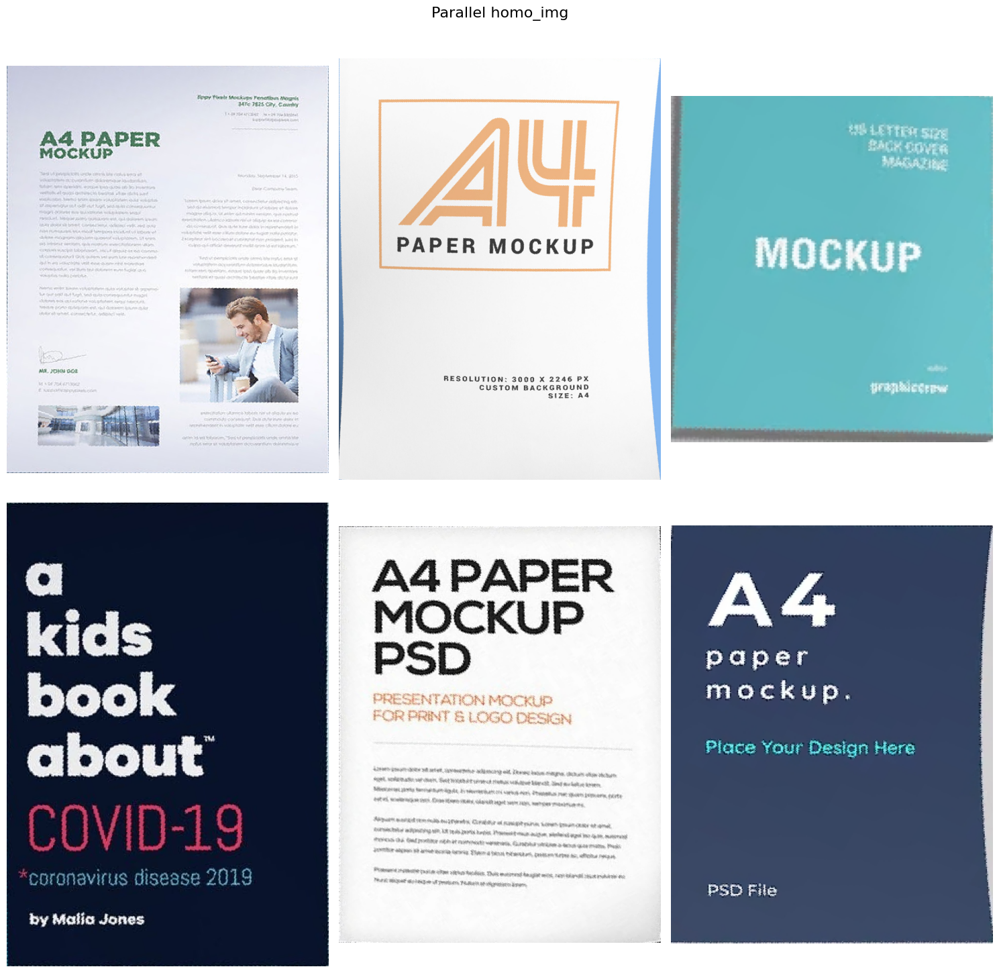

In [ ]:
ncol = math.ceil(len(img) / 2)
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
img_idx = 0
for i in range(nrow):
    for j in range(ncol):
        if img_idx < len(img):
            ax = axes[i, j]
            ax.imshow(homo_img_cuda[img_idx])
            img_idx += 1
            ax.axis('off')
        else:
            axes[i, j].axis('off')

fig.suptitle('Parallel homo_img', fontsize=16)
plt.tight_layout()
plt.show()

Độ chính xác giữa Cuda và OpenCV của hàm đưa ảnh về đối diện màn hình

In [ ]:
homo_img_cuda_accuracy = [evaluate_accuracy(homo_img_cv[i], homo_img_cuda[i]) for i in range(len(img))]
print('Độ chính xác giữa Cuda và OpenCV là: ', np.mean(homo_img_cuda_accuracy))

Độ chính xác giữa Cuda và OpenCV là:  0.9558051102568833


#### 6.8 Làm mới hình ảnh

In [ ]:
brightness = 200
contrast = 140

homo_img_cuda = [homo_img_cuda[i].astype(int) for i in range(len(img))]
in_adjust = [homo_img_cuda[i].copy() for i in range(len(img))]

Thời gian làm mới ảnh song song

In [ ]:
start_time = time.time()
new_image_cuda = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
end_time = time.time()

execution_new_image_cuda_time = end_time - start_time
execution_new_image_cuda_time

0.02164149284362793

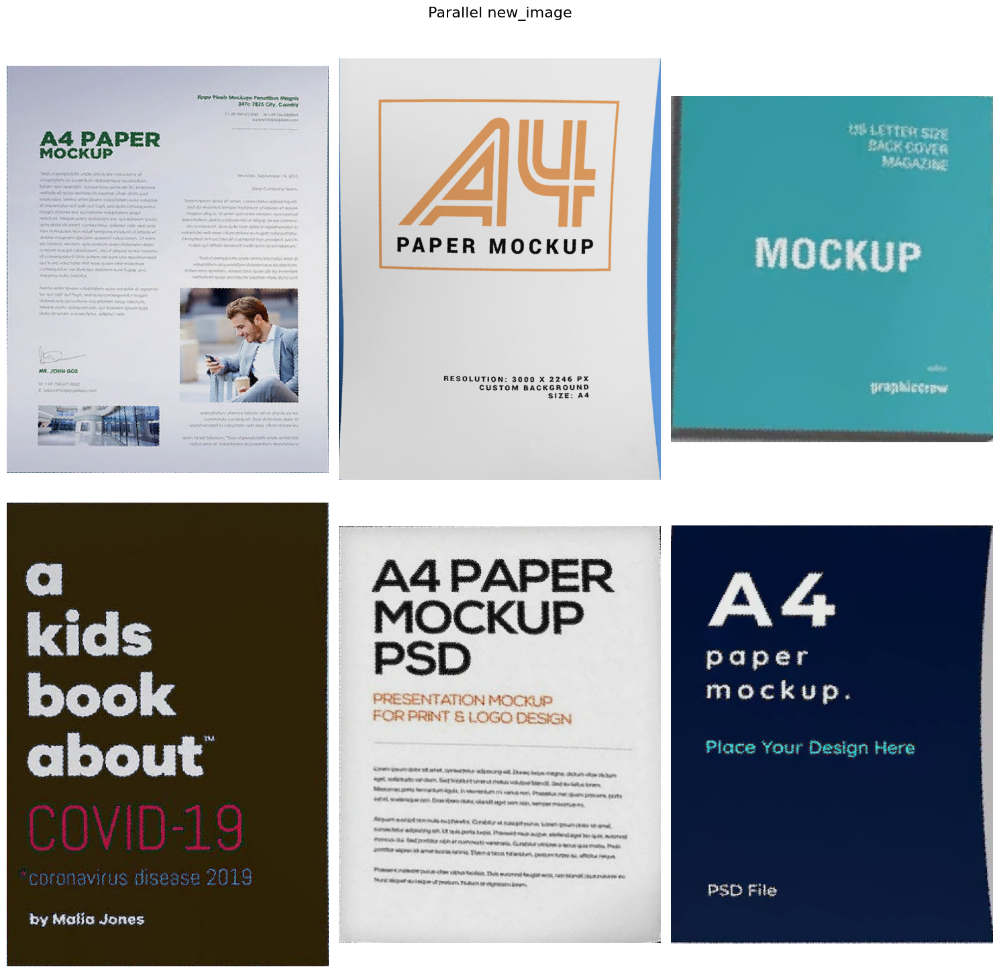

In [ ]:
ncol = math.ceil(len(img) / 2)
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(15,15))
img_idx = 0
for i in range(nrow):
    for j in range(ncol):
        if img_idx < len(img):
            ax = axes[i, j]
            ax.imshow(new_image_cuda[img_idx])
            img_idx += 1
            ax.axis('off')
        else:
            axes[i, j].axis('off')

fig.suptitle('Parallel new_image', fontsize=16)
plt.tight_layout()
plt.show()

Độ chính xác giữa Cuda và OpenCV của hàm làm mới ảnh

In [ ]:
new_image_cuda_accuracy = [evaluate_accuracy(new_image_cv[i], new_image_cuda[i]) for i in range(len(img))]
print('Độ chính xác giữa Cuda và OpenCV là: ', np.mean(new_image_cuda_accuracy))

Độ chính xác giữa Cuda và OpenCV là:  0.9509202586158617


#### Tổng hợp

##### Thời gian

In [ ]:
import pandas as pd

time_name = ['Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
cv = [execution_gray_cv_time, execution_gaussianBlur_cv_time, execution_canny_edge_cv_time, execution_output_4_points_cv_time, execution_homo_img_cv_time, execution_new_image_cv_time]
py = [execution_gray_py_time, execution_gaussianBlur_py_time, execution_canny_edge_py_time, execution_output_4_points_py_time, execution_homo_img_py_time, execution_new_image_py_time]
cuda = [execution_gray_cuda_time, execution_gaussianBlur_cuda_time, execution_canny_edge_cuda_time, execution_output_4_points_cuda_time, execution_map_homo_cuda_time, execution_new_image_cuda_time]

time_cv = pd.DataFrame(data=cv, index=time_name, columns=['OpenCV (s)'])
time_py = pd.DataFrame(data=py, index=time_name, columns=['@jit (s)'])
time_cuda = pd.DataFrame(data=cuda, index=time_name, columns=['@cuda.jit (s)'])

time = pd.concat([time_py, time_cv, time_cuda], axis=1)
time.columns = ['@jit (s)', 'OpenCV (s)', '@Cuda.jit (s)']
time.loc['Total Time']= time.sum(numeric_only=True, axis=0)
time

,@jit (s),OpenCV (s),@Cuda.jit (s)
Gray,0.019715,0.026791,0.034536
GaussianBlur,0.146954,0.014289,0.055799
Canny_edge,0.756389,0.034720,0.481269
Output_4_points,0.007530,0.005304,0.002408
Homo_img,0.037193,0.049332,0.028302
New_image,0.005775,0.001613,0.021641
Total Time,0.973557,0.132051,0.623955


Tốc độ thực thi của hàm openCV và song song nhanh gấp 30 lần so với hàm tuần tự.

##### Hình ảnh

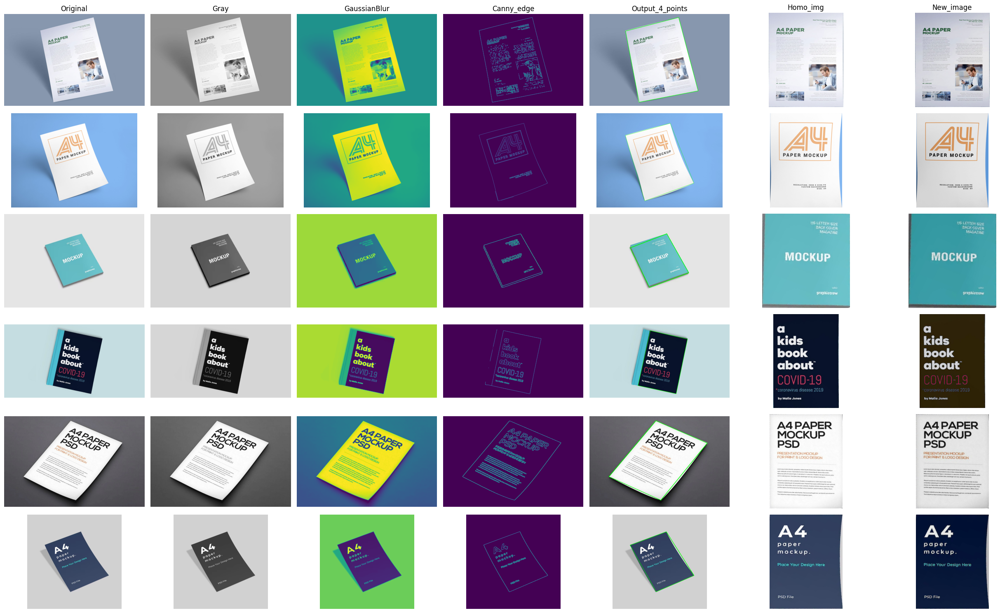

In [ ]:
images = zip(img, gray_cuda, gaussian_cuda, canny_edge_cuda, output_4_points_cuda, homo_img_cuda, new_image_cuda)
titles = ['Original', 'Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
array_img = list(images)
ncol = 7
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(25,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        if j == 1:
            ax.imshow(array_img[i][j], cmap='gray')
        else:
            ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

##### Độ chính xác

In [ ]:
all_accuracy_jit = [gray_accuracy, gaussianBlur_accuracy, canny_edge_accuracy,
                    output_4_points_accuracy, homo_img_accuracy, new_image_accuracy]
all_accuracy_cuda = [gray_cuda_accuracy, gaussianBlur_cuda_accuracy, canny_edge_cuda_accuracy,
                    output_4_points_cuda_accuracy, homo_img_cuda_accuracy, new_image_cuda_accuracy]
titles = ['Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']

# for title, accuracy in zip(titles, all_accuracy_jit):
#     print(f"Độ chính xác @Jit {title}: {np.mean(accuracy)}")
# print('\n')
# for title, accuracy in zip(titles, all_accuracy_cuda):
#     print(f"Độ chính xác @Cuda.jit {title}: {np.mean(accuracy)}")
means_jit = [np.mean(acc) for acc in all_accuracy_jit]
means_cuda = [np.mean(acc) for acc in all_accuracy_cuda]

# Tạo bảng pandas với các giá trị trung bình
df = pd.DataFrame({
    'Work': titles,
    'JIT Accuracy': means_jit,
    'CUDA Accuracy': means_cuda
})

# Hiển thị bảng
df


,Work,JIT Accuracy,CUDA Accuracy
0,Gray,1.000000,1.000000
1,GaussianBlur,0.999995,0.999995
2,Canny_edge,0.989049,0.988856
3,Output_4_points,0.997523,0.997523
4,Homo_img,0.955805,0.955805
5,New_image,0.950920,0.950920


### 7. Cài đặt tối ưu song song lần 1

Đầu tiên ta sẽ tính thời gian thực thi của toàn bộ quá trình phiên bản song song, sau đó sẽ dùng **nvprof** để xem thời gian tại bước nào là chiếm nhiều thời gian nhất rồi tối ưu nó.

Thời gian thực thi

In [ ]:
!python parallel.py --config config.json


Processed time:  25.327409505844116 s


Phân tích thời gian thực thi bằng nvprof

In [ ]:
!nvprof --print-gpu-trace python parallel.py --config config.json

==6087== NVPROF is profiling process 6087, command: python3 parallel.py --config config.json

Processed time:  16.005799770355225 s
==6087== Profiling application: python3 parallel.py --config config.json
==6087== Profiling result:
   Start  Duration            Grid Size      Block Size     Regs*    SSMem*    DSMem*      Size  Throughput  SrcMemType  DstMemType           Device   Context    Stream  Name
834.24ms  289.50us                    -               -         -         -         -  1.8797MB  6.3408GB/s    Pageable      Device     Tesla T4 (0)         1         7  [CUDA memcpy HtoD]
835.59ms  1.8604ms                    -               -         -         -         -  5.0125MB  2.6312GB/s    Pageable      Device     Tesla T4 (0)         1         7  [CUDA memcpy HtoD]
837.69ms  161.72us            (32 21 1)       (32 32 1)        17        0B        0B         -           -           -           -     Tesla T4 (0)         1         7  _ZN6cudapy8__main__24convert_RGB_To_Gray_cuda

* Nhận xét
    * Có thể thấy sao chép dữ liệu từ CPU sang GPU và ngược lại tốn nhiều thời gian nhất. Ở phiên bản song song hiện tại thì dữ liệu sẽ được copy sang GPU mỗi khi gọi hàm và copy về CPU sau khi thực hiện xong hàm đó --> chỉ copy những dữ liệu cần thiết, hạn chế copy qua lại nhiều lần giữa CPU và GPU.
    * Thời gian thực thi của hàm gradient, hàm tích chập tốn nhiều thời gian nhất --> tập trung tối ưu các phần này.

#### Data Transfer Optimization

Do thời gian dữ liệu chạy từ CPU sang GPU và ngược lại khá lớn nên sẽ copy những dữ liệu cần thiết từ CPU sang và tạo mảng dữ liệu bên GPU để hạn chế số lần copy.

In [ ]:
# Chuyển dữ liệu ảnh từ CPU sang GPU
from numba import cuda
d_img = [cuda.to_device(img[i]) for i in range(len(img))]

Làm xám ảnh

In [ ]:
import time

In [ ]:
d_gray_op1 = [cuda.device_array((d_img[i].shape[0], d_img[i].shape[1]), img[i].dtype) for i in range(len(img))]

grid_size = [(math.ceil(d_gray_op1[i].shape[1] / block_size[0]), #chieu x
             math.ceil(d_gray_op1[i].shape[0] / block_size[1])) for i in range(len(img))] #chieu y

for i in range(len(img)):
    convert_RGB_To_Gray_cuda[grid_size[i], block_size](d_img[i], d_gray_op1[i])

start_time = time.time()
for i in range(len(img)):
    convert_RGB_To_Gray_cuda[grid_size[i], block_size](d_img[i], d_gray_op1[i])
end_time = time.time()

execution_gray_op1_time = end_time - start_time

gray_op1 = [d_gray_op1[i].copy_to_host() for i in range(len(img))]

Làm mờ ảnh và hàm convolution

In [ ]:
d_gaussian_op1 = [cuda.device_array(d_gray_op1[i].shape, dtype = np.float64) for i in range(len(img))]
d_gau_kernel_op1 = cuda.to_device(gau_kernel)

for i in range(len(img)):
    convolution_cuda[grid_size[i], block_size](d_gray_op1[i], d_gaussian_op1[i], d_gau_kernel_op1)

start_time = time.time()
for i in range(len(img)):
    convolution_cuda[grid_size[i], block_size](d_gray_op1[i], d_gaussian_op1[i], d_gau_kernel_op1)
end_time = time.time()

execution_gaussianBlur_op1_time = end_time - start_time

gaussian_op1 = [d_gaussian_op1[i].copy_to_host() for i in range(len(img))]

Tính gradient và hướng gradient

In [ ]:
d_edge_grad_op1 = [cuda.device_array(d_gaussian_op1[i].shape, d_gaussian_op1[i].dtype) for i in range(len(img))]
d_angle_op1 = [cuda.device_array(d_gaussian_op1[i].shape, d_gaussian_op1[i].dtype) for i in range(len(img))]
d_sobel_x_op1, d_sobel_y_op1 = cuda.to_device(sobel_x_kernel), cuda.to_device(sobel_y_kernel)

for i in range(len(img)):
    gradient_cuda[grid_size[i], block_size](d_gaussian_op1[i], d_edge_grad_op1[i], d_angle_op1[i], d_sobel_x_op1, d_sobel_y_op1)

start_time = time.time()
for i in range(len(img)):
    gradient_cuda[grid_size[i], block_size](d_gaussian_op1[i], d_edge_grad_op1[i], d_angle_op1[i], d_sobel_x_op1, d_sobel_y_op1)
end_time = time.time()

execution_gradient_op1_time = end_time - start_time

edge_grad_op1 = [d_edge_grad_op1[i].copy_to_host() for i in range(len(img))]
angle_op1 = [d_angle_op1[i].copy_to_host() for i in range(len(img))]

Non-max suppression

In [ ]:
d_non_max_op1 = [cuda.device_array(d_edge_grad_op1[i].shape, d_edge_grad_op1[i].dtype) for i in range(len(img))]

for i in range(len(img)):
    nonMaxSuppression_cuda[grid_size[i], block_size](d_edge_grad_op1[i], d_non_max_op1[i], d_angle_op1[i])

start_time = time.time()
for i in range(len(img)):
    nonMaxSuppression_cuda[grid_size[i], block_size](d_edge_grad_op1[i], d_non_max_op1[i], d_angle_op1[i])
end_time = time.time()

execution_non_max_suppression_op1_time = end_time - start_time

non_max_op1 = [d_non_max_op1[i].copy_to_host() for i in range(len(img))]

Lọc ngưỡng

In [ ]:
max_val_op1 = [np.zeros(len(img[i]), dtype = np.float32)for i in range(len(img))]
d_max_val_op1 = [cuda.to_device(max_val_op1[i]) for i in range(len(img))]

for i in range(len(img)):
    findMax[grid_size[i],block_size](d_max_val_op1[i], d_non_max_op1[i])

start_time = time.time()
for i in range(len(img)):
    findMax[grid_size[i],block_size](d_max_val_op1[i], d_non_max_op1[i])
end_time = time.time()

execution_findMax_op1_time = end_time - start_time

min_thres = 0.05
max_thres = 0.15

max_val = [x.copy_to_host() for x in d_max_val_op1]
max_val = [x[0] * max_thres for x in max_val]
min_val = [x * min_thres for x in max_val]

d_canny_edge_op1 = [cuda.device_array(d_non_max_op1[i].shape, np.uint8) for i in range(len(img))]
for i in range(len(img)):
    thresholding_cuda[grid_size[i], block_size](d_non_max_op1[i], d_canny_edge_op1[i], min_val[i], max_val[i])

start_time = time.time()
for i in range(len(img)):
    thresholding_cuda[grid_size[i], block_size](d_non_max_op1[i], d_canny_edge_op1[i], min_val[i], max_val[i])
end_time = time.time()

execution_thresholding_op1_time = end_time - start_time

canny_edge_op1 = [d_canny_edge_op1[i].copy_to_host() for i in range(len(img))]

# Tổng hợp thời gian xác định viền
execution_canny_edge_op1_time = execution_thresholding_op1_time + execution_findMax_op1_time + execution_non_max_suppression_op1_time + execution_gradient_op1_time


Xác định 4 đỉnh và hình chữ nhật

In [ ]:
H_op1, maxWidth_op1, maxHeight_op1, four_vertices_cnts_op1 = [], [], [], []
for i in range(len(img)):
    temp_H_op1, temp_maxWidth_op1, temp_maxHeight_op1, temp_four_vertices_cnts_op1 = transform_to_max_rectangle(canny_edge_op1[i])
    H_op1.append(temp_H_op1)
    maxWidth_op1.append(temp_maxWidth_op1)
    maxHeight_op1.append(temp_maxHeight_op1)
    four_vertices_cnts_op1.append(temp_four_vertices_cnts_op1)

output_4_points_op1 = [x.copy() for x in img]

start_time = time.time()
_ = [cv2.drawContours(output_4_points_op1[i], [four_vertices_cnts_op1[i]], 0, (0, 255, 0), 2) for i in range(len(img))]
end_time = time.time()

execution_output_4_points_op1_time = end_time - start_time

Xác định các tọa độ mới cho ảnh

In [ ]:
d_homo_img_op1 = [cuda.device_array((maxWidth_op1[i], maxHeight_op1[i], img[i].shape[-1]), img[i].dtype) for i in range(len(img))]
# d_homo_img_op1 = []
# for i in range(len(img)):
#     if maxHeight_op1[i] != maxWidth_cv[i] or maxWidth_op1[i] != maxHeight_cv[i]:
#         maxHeight_op1[i] = maxWidth_cv[i]
#         maxWidth_op1[i] = maxHeight_cv[i]
#         d_homo_img_op1.append(cuda.device_array((maxWidth_op1[i], maxHeight_op1[i], img[i].shape[-1]), img[i].dtype))
#     else:
#         d_homo_img_op1.append(cuda.device_array((maxWidth_op1[i], maxHeight_op1[i], img[i].shape[-1]), img[i].dtype))

d_H_op1 = [cuda.to_device(H_op1[i]) for i in range(len(img))]

grid_size = [(math.ceil(maxHeight_op1[i] / block_size[0]), #chieu x
             math.ceil(maxWidth_op1[i] / block_size[1])) for i in range(len(img))] #chieu y

for i in range(len(img)):
    map_homo_cuda[grid_size[i], block_size](d_img[i], d_homo_img_op1[i], d_H_op1[i])

start_time = time.time()
for i in range(len(img)):
    map_homo_cuda[grid_size[i], block_size](d_img[i], d_homo_img_op1[i], d_H_op1[i])
end_time = time.time()

execution_map_homo_op1_time = end_time - start_time

homo_img_op1 = [d_homo_img_op1[i].copy_to_host() for i in range(len(img))]

Làm mới hình ảnh

In [ ]:
in_adjust = [homo_img_op1[i].copy() for i in range(len(img))]

new_image_op1 = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
start_time = time.time()
new_image_op1 = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
end_time = time.time()

execution_new_image_op1_time = end_time - start_time

#### Tổng hợp

##### Thời gian

In [ ]:
import pandas as pd

time_name = ['Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
cv = [execution_gray_cv_time, execution_gaussianBlur_cv_time, execution_canny_edge_cv_time,
      execution_output_4_points_cv_time, execution_homo_img_cv_time, execution_new_image_cv_time]
py = [execution_gray_py_time, execution_gaussianBlur_py_time, execution_canny_edge_py_time,
      execution_output_4_points_py_time, execution_homo_img_py_time, execution_new_image_py_time]
cuda = [execution_gray_cuda_time, execution_gaussianBlur_cuda_time, execution_canny_edge_cuda_time,
        execution_output_4_points_cuda_time, execution_map_homo_cuda_time, execution_new_image_cuda_time]
cuda_op1 = [execution_gray_op1_time, execution_gaussianBlur_op1_time, execution_canny_edge_op1_time,
        execution_output_4_points_op1_time, execution_map_homo_op1_time, execution_new_image_op1_time]

time_cv = pd.DataFrame(data=cv, index=time_name, columns=['OpenCV (s)'])
time_py = pd.DataFrame(data=py, index=time_name, columns=['@jit (s)'])
time_cuda = pd.DataFrame(data=cuda, index=time_name, columns=['@cuda.jit (s)'])
time_cuda_op1 = pd.DataFrame(data=cuda_op1, index=time_name, columns=['@cuda.jit (s) op1'])

time = pd.concat([time_py, time_cv, time_cuda, time_cuda_op1], axis=1)
time.columns = ['@jit (s)', 'OpenCV (s)', '@Cuda.jit (s)', 'Optimization 1 (s)']
time.loc['Total Time']= time.sum(numeric_only=True, axis=0)
time

,@jit (s),OpenCV (s),@Cuda.jit (s),Optimization 1 (s)
Gray,0.019715,0.026791,0.034536,0.000878
GaussianBlur,0.146954,0.014289,0.055799,0.000746
Canny_edge,0.756389,0.034720,0.481269,0.006330
Output_4_points,0.007530,0.005304,0.002408,0.000924
Homo_img,0.037193,0.049332,0.028302,0.001066
New_image,0.005775,0.001613,0.021641,0.009312
Total Time,0.973557,0.132051,0.623955,0.019258


##### Hình ảnh

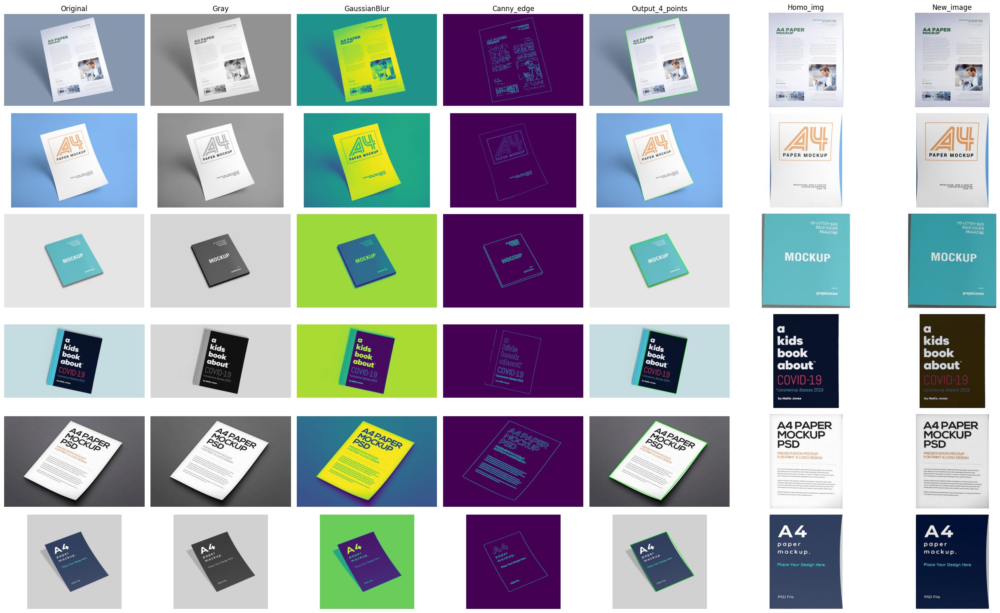

In [ ]:
images = zip(img, gray_op1, gaussian_op1, canny_edge_op1, output_4_points_op1, homo_img_op1, new_image_op1)
titles = ['Original', 'Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
array_img = list(images)
ncol = 7
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(25,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        if j == 1:
            ax.imshow(array_img[i][j], cmap='gray')
        else:
            ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()

##### Độ chính xác

In [ ]:
# all_accuracy_jit = [gray_op1, gaussian_op1, canny_edge_op1,
#                     output_4_points_op1, homo_img_op1, new_image_op1]
# all_accuracy_cuda = [gray_cuda_accuracy, gaussianBlur_cuda_accuracy, canny_edge_cuda_accuracy,
#                     output_4_points_cuda_accuracy, homo_img_cuda_accuracy, new_image_cuda_accuracy]
# titles = ['Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']

# for title, accuracy in zip(titles, all_accuracy_jit):
#     print(f"Độ chính xác @Jit {title}: {np.mean(accuracy)}")
# print('\n')
# for title, accuracy in zip(titles, all_accuracy_cuda):
#     print(f"Độ chính xác @Cuda.jit {title}: {np.mean(accuracy)}")

### 8. Cài đặt tối ưu song song lần 2


#### CNEM Optimization

In [ ]:
from numba import cuda
import time
import pandas as pd

In [ ]:
@cuda.jit
def convolutionLayer_kernel_cmem(img_in, img_out, kernel):
    col, row = cuda.grid(2)
    kernel_cmem = cuda.const.array_like(kernel)
    if row < img_in.shape[0] and col < img_in.shape[1]:
        result = 0
        for i in range(kernel_cmem.shape[0]):
            for j in range(kernel_cmem.shape[1]):
                in_row = row - kernel_cmem.shape[0] // 2 + i
                in_col = col - kernel_cmem.shape[1] // 2 + j

                in_row = min(max(0, in_row), img_in.shape[0] - 1)
                in_col = min(max(0, in_col), img_in.shape[1] - 1)

                result += kernel_cmem[i, j] * img_in[in_row, in_col]

        img_out[row, col] = round(result)

In [ ]:
!nvprof --version

nvprof: NVIDIA (R) Cuda command line profiler
Copyright (c) 2012 - 2023 NVIDIA Corporation
Release version 12.2.142 (21)


### 8. Cài đặt tối ưu song song lần 3


#### Cuda Stream

In [ ]:
# Chuyển dữ liệu ảnh từ CPU sang GPU
from numba import cuda
d_img = [cuda.to_device(img[i]) for i in range(len(img))]

Làm xám ảnh

In [ ]:
d_gray_op3 = [cuda.device_array((d_img[i].shape[0], d_img[i].shape[1]), img[i].dtype) for i in range(len(img))]

grid_size = [(math.ceil(d_gray_op3[i].shape[1] / block_size[0]), #chieu x
             math.ceil(d_gray_op3[i].shape[0] / block_size[1])) for i in range(len(img))] #chieu y

streams = [cuda.stream() for _ in range(len(img))]
for i in range(len(img)):
    convert_RGB_To_Gray_cuda[grid_size[i], block_size, streams[i]](d_img[i], d_gray_op3[i])

for stream in streams:
    stream.synchronize()

start_time = time.time()
for i in range(len(img)):
    convert_RGB_To_Gray_cuda[grid_size[i], block_size, streams[i]](d_img[i], d_gray_op3[i])

for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_gray_op3_time = end_time - start_time

gray_op3 = [d_gray_op3[i].copy_to_host() for i in range(len(img))]

Làm mờ ảnh và hàm convolution

In [ ]:
d_gaussian_op3 = [cuda.device_array(d_gray_op3[i].shape, dtype = np.float64) for i in range(len(img))]
d_gau_kernel_op3 = cuda.to_device(gau_kernel)
streams = [cuda.stream() for _ in range(len(img))]

for i in range(len(img)):
    convolution_cuda[grid_size[i], block_size, streams[i]](d_gray_op3[i], d_gaussian_op3[i], d_gau_kernel_op3)
for stream in streams:
    stream.synchronize()

start_time = time.time()
for i in range(len(img)):
    convolution_cuda[grid_size[i], block_size, streams[i]](d_gray_op3[i], d_gaussian_op3[i], d_gau_kernel_op3)
for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_gaussianBlur_op3_time = end_time - start_time

gaussian_op3 = [d_gaussian_op3[i].copy_to_host() for i in range(len(img))]

Tính gradient và hướng gradient

In [ ]:
d_edge_grad_op3 = [cuda.device_array(d_gaussian_op3[i].shape, d_gaussian_op3[i].dtype) for i in range(len(img))]
d_angle_op3 = [cuda.device_array(d_gaussian_op3[i].shape, d_gaussian_op3[i].dtype) for i in range(len(img))]
d_sobel_x_op3, d_sobel_y_op3 = cuda.to_device(sobel_x_kernel), cuda.to_device(sobel_y_kernel)
streams = [cuda.stream() for _ in range(len(img))]

for i in range(len(img)):
    gradient_cuda[grid_size[i], block_size, streams[i]](d_gaussian_op3[i], d_edge_grad_op3[i], d_angle_op3[i], d_sobel_x_op3, d_sobel_y_op3)
for stream in streams:
    stream.synchronize()
start_time = time.time()
for i in range(len(img)):
    gradient_cuda[grid_size[i], block_size, streams[i]](d_gaussian_op3[i], d_edge_grad_op3[i], d_angle_op3[i], d_sobel_x_op3, d_sobel_y_op3)
for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_gradient_op3_time = end_time - start_time

edge_grad_op3 = [d_edge_grad_op3[i].copy_to_host() for i in range(len(img))]
angle_op3 = [d_angle_op3[i].copy_to_host() for i in range(len(img))]

Non-max suppression

In [ ]:
d_non_max_op3 = [cuda.device_array(d_edge_grad_op3[i].shape, d_edge_grad_op3[i].dtype) for i in range(len(img))]
streams = [cuda.stream() for _ in range(len(img))]

for i in range(len(img)):
    nonMaxSuppression_cuda[grid_size[i], block_size, streams[i]](d_edge_grad_op3[i], d_non_max_op3[i], d_angle_op3[i])
for stream in streams:
    stream.synchronize()

start_time = time.time()
for i in range(len(img)):
    nonMaxSuppression_cuda[grid_size[i], block_size, streams[i]](d_edge_grad_op3[i], d_non_max_op3[i], d_angle_op3[i])
for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_non_max_suppression_op3_time = end_time - start_time

non_max_op3 = [d_non_max_op3[i].copy_to_host() for i in range(len(img))]

Lọc ngưỡng

In [ ]:
max_val_op3 = [np.zeros(len(img[i]), dtype = np.float32)for i in range(len(img))]
d_max_val_op3 = [cuda.to_device(max_val_op3[i]) for i in range(len(img))]
streams = [cuda.stream() for _ in range(len(img))]

for i in range(len(img)):
    findMax[grid_size[i],block_size,streams[i]](d_max_val_op3[i], d_non_max_op3[i])
for stream in streams:
    stream.synchronize()

start_time = time.time()
for i in range(len(img)):
    findMax[grid_size[i],block_size,streams[i]](d_max_val_op3[i], d_non_max_op3[i])
for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_findMax_op3_time = end_time - start_time

min_thres = 0.05
max_thres = 0.15

max_val = [x.copy_to_host() for x in d_max_val_op3]
max_val = [x[0] * max_thres for x in max_val]
min_val = [x * min_thres for x in max_val]

d_canny_edge_op3 = [cuda.device_array(d_non_max_op3[i].shape, np.uint8) for i in range(len(img))]
for i in range(len(img)):
    thresholding_cuda[grid_size[i], block_size,streams[i]](d_non_max_op3[i], d_canny_edge_op3[i], min_val[i], max_val[i])
for stream in streams:
    stream.synchronize()
start_time = time.time()
for i in range(len(img)):
    thresholding_cuda[grid_size[i], block_size,streams[i]](d_non_max_op3[i], d_canny_edge_op3[i], min_val[i], max_val[i])
for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_thresholding_op3_time = end_time - start_time

canny_edge_op3 = [d_canny_edge_op3[i].copy_to_host() for i in range(len(img))]

# Tổng hợp thời gian xác định viền
execution_canny_edge_op3_time = execution_thresholding_op3_time + execution_findMax_op3_time + execution_non_max_suppression_op3_time + execution_gradient_op3_time


Xác định 4 đỉnh và hình chữ nhật

In [ ]:
H_op3, maxWidth_op3, maxHeight_op3, four_vertices_cnts_op3 = [], [], [], []
for i in range(len(img)):
    temp_H_op3, temp_maxWidth_op3, temp_maxHeight_op3, temp_four_vertices_cnts_op3 = transform_to_max_rectangle(canny_edge_op3[i])
    H_op3.append(temp_H_op3)
    maxWidth_op3.append(temp_maxWidth_op3)
    maxHeight_op3.append(temp_maxHeight_op3)
    four_vertices_cnts_op3.append(temp_four_vertices_cnts_op3)

output_4_points_op3 = [x.copy() for x in img]

start_time = time.time()
_ = [cv2.drawContours(output_4_points_op3[i], [four_vertices_cnts_op3[i]], 0, (0, 255, 0), 2) for i in range(len(img))]
end_time = time.time()

execution_output_4_points_op3_time = end_time - start_time

Xác định các tọa độ mới cho ảnh

In [ ]:
d_homo_img_op3 = [cuda.device_array((maxWidth_op3[i], maxHeight_op3[i], img[i].shape[-1]), img[i].dtype) for i in range(len(img))]
# d_homo_img_op1 = []
# for i in range(len(img)):
#     if maxHeight_op1[i] != maxWidth_cv[i] or maxWidth_op1[i] != maxHeight_cv[i]:
#         maxHeight_op1[i] = maxWidth_cv[i]
#         maxWidth_op1[i] = maxHeight_cv[i]
#         d_homo_img_op1.append(cuda.device_array((maxWidth_op1[i], maxHeight_op1[i], img[i].shape[-1]), img[i].dtype))
#     else:
#         d_homo_img_op1.append(cuda.device_array((maxWidth_op1[i], maxHeight_op1[i], img[i].shape[-1]), img[i].dtype))

d_H_op3 = [cuda.to_device(H_op3[i]) for i in range(len(img))]

grid_size = [(math.ceil(maxHeight_op3[i] / block_size[0]), #chieu x
             math.ceil(maxWidth_op3[i] / block_size[1])) for i in range(len(img))] #chieu y
streams = [cuda.stream() for _ in range(len(img))]

for i in range(len(img)):
    map_homo_cuda[grid_size[i], block_size, streams[i]](d_img[i], d_homo_img_op3[i], d_H_op3[i])
for stream in streams:
    stream.synchronize()
start_time = time.time()
for i in range(len(img)):
    map_homo_cuda[grid_size[i], block_size, streams[i]](d_img[i], d_homo_img_op3[i], d_H_op3[i])
for stream in streams:
    stream.synchronize()
end_time = time.time()

execution_map_homo_op3_time = end_time - start_time

homo_img_op3 = [d_homo_img_op3[i].copy_to_host() for i in range(len(img))]

Làm mới hình ảnh

In [ ]:
in_adjust = [homo_img_op3[i].copy() for i in range(len(img))]

new_image_op3 = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
start_time = time.time()
new_image_op3 = [controller(in_adjust[i], brightness, contrast) for i in range(len(img))]
end_time = time.time()

execution_new_image_op3_time = end_time - start_time

#### Tổng hợp

##### Thời gian

In [ ]:
import pandas as pd

time_name = ['Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
cv = [execution_gray_cv_time, execution_gaussianBlur_cv_time, execution_canny_edge_cv_time,
      execution_output_4_points_cv_time, execution_homo_img_cv_time, execution_new_image_cv_time]
py = [execution_gray_py_time, execution_gaussianBlur_py_time, execution_canny_edge_py_time,
      execution_output_4_points_py_time, execution_homo_img_py_time, execution_new_image_py_time]
cuda = [execution_gray_cuda_time, execution_gaussianBlur_cuda_time, execution_canny_edge_cuda_time,
        execution_output_4_points_cuda_time, execution_map_homo_cuda_time, execution_new_image_cuda_time]
cuda_op1 = [execution_gray_op1_time, execution_gaussianBlur_op1_time, execution_canny_edge_op1_time,
        execution_output_4_points_op1_time, execution_map_homo_op1_time, execution_new_image_op1_time]
cuda_op3 = [execution_gray_op3_time, execution_gaussianBlur_op3_time, execution_canny_edge_op3_time,
        execution_output_4_points_op3_time, execution_map_homo_op3_time, execution_new_image_op3_time]

time_cv = pd.DataFrame(data=cv, index=time_name, columns=['OpenCV (s)'])
time_py = pd.DataFrame(data=py, index=time_name, columns=['@jit (s)'])
time_cuda = pd.DataFrame(data=cuda, index=time_name, columns=['@cuda.jit (s)'])
time_cuda_op1 = pd.DataFrame(data=cuda_op1, index=time_name, columns=['@cuda.jit (s) op1'])
time_cuda_op3 = pd.DataFrame(data=cuda_op3, index=time_name, columns=['@cuda.jit (s) op3'])

time = pd.concat([time_py, time_cv, time_cuda, time_cuda_op1,time_cuda_op3], axis=1)
time.columns = ['@jit (s)', 'OpenCV (s)', '@Cuda.jit (s)', 'Optimization 1 (s)', 'Optimization 3 (s)']
time.loc['Total Time']= time.sum(numeric_only=True, axis=0)
time

,@jit (s),OpenCV (s),@Cuda.jit (s),Optimization 1 (s),Optimization 3 (s)
Gray,0.019715,0.026791,0.034536,0.000795,0.001275
GaussianBlur,0.146954,0.014289,0.055799,0.000746,0.011391
Canny_edge,0.756389,0.034720,0.481269,0.006330,0.022159
Output_4_points,0.007530,0.005304,0.002408,0.000924,0.000794
Homo_img,0.037193,0.049332,0.028302,0.001066,0.002549
New_image,0.005775,0.001613,0.021641,0.009312,0.002847
Total Time,0.973557,0.132051,0.623955,0.019175,0.041015


##### Hình ảnh

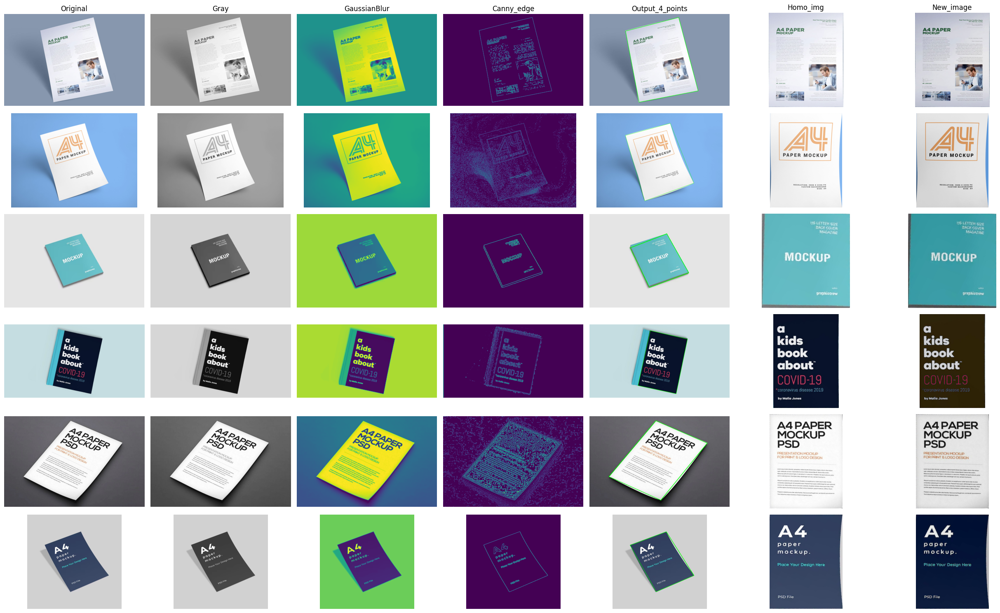

In [ ]:
images = zip(img, gray_op3, gaussian_op3, canny_edge_op3, output_4_points_op3, homo_img_op3, new_image_op3)
titles = ['Original', 'Gray', 'GaussianBlur', 'Canny_edge', 'Output_4_points', 'Homo_img', 'New_image']
array_img = list(images)
ncol = 7
nrow = len(array_img)
fig, axes = plt.subplots(nrows=nrow, ncols=ncol,figsize=(25,15))
for i in range(nrow):
    for j in range(ncol):
        ax = axes[i, j]
        if j == 1:
            ax.imshow(array_img[i][j], cmap='gray')
        else:
            ax.imshow(array_img[i][j])
        if i == 0:
            ax.set_title(titles[j])
        ax.axis('off')
plt.tight_layout()
plt.show()